<a href="https://colab.research.google.com/github/Pasewark/LSC/blob/main/more_random_data_and_templates.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# install geotorch
!pip install git+https://github.com/Lezcano/geotorch/


  Cloning https://github.com/Lezcano/geotorch/ to /tmp/pip-req-build-b8bjgspa
  Running command git clone -q https://github.com/Lezcano/geotorch/ /tmp/pip-req-build-b8bjgspa
  Created wheel for geotorch: filename=geotorch-0.2.0-py3-none-any.whl size=58703 sha256=507a2dc7a9920f1b1955a6a123b2e0d84448f0fbc44f598b4ec1c8f9e7ed749e
  Stored in directory: /tmp/pip-ephem-wheel-cache-zkq5xgc8/wheels/3c/96/d6/4e2a53fc6cf0a50c5c08318205d4c5bf815216196aafcc86cb
Successfully built geotorch


In [2]:
# download the LSC code from the paper
# need to move the files into the working directory after download
!git clone https://github.com/hchau630/LSC.git
!cp LSC/lsc.py lsc.py
!cp LSC/sc.py sc.py
!cp LSC/utils.py utils.py
!cp LSC/image_transform.py image_transform.py

Cloning into 'LSC'...
remote: Enumerating objects: 645, done.
remote: Counting objects: 100% (21/21), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 645 (delta 6), reused 7 (delta 2), pack-reused 624
Receiving objects: 100% (645/645), 432.11 MiB | 30.03 MiB/s, done.
Resolving deltas: 100% (9/9), done.


In [3]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as f
import torch.nn as nn
import importlib
import torchvision
import torchvision.datasets as datasets
import time
import lsc
import sc
import matplotlib.animation as animation
import utils
import image_transform as img_tran
import os
import shutil
import geotorch
from torchvision.transforms import RandomErasing
import torchvision.transforms.functional as tvF


In [4]:
# torch.set_default_tensor_type(torch.cuda.FloatTensor)
torch.cuda.set_device(0) #use GPU 0

In [65]:
def plot_psi(psi, rgb=False, show=False, save=None, box_margins=[0.05,0.95,0.95,0.05]):
    fig = plt.figure(figsize=(10,int(K/10)))
    for k in range(K):
        fig.add_subplot(int(K/10),10,k+1)
        plt.xticks([])
        plt.yticks([])
        if rgb:
            plt.imshow((psi[:,k]/psi[:,k].max()).clamp(min=0.).reshape(3,dim,dim).permute(1,2,0).cpu())
        else:
            plt.imshow(psi[:,k].reshape(dim,dim).cpu(), cmap="Greys")
#     plt.tight_layout()
    plt.subplots_adjust(wspace=0.0, left=box_margins[0], right=box_margins[1], top=box_margins[2], bottom=box_margins[3])
    if save is not None:
        plt.savefig(save)
    if show:
        plt.show()
    plt.close(fig)

def plot_w(w, rgb=False, show=False, save=None, cols=16):
    fig = plt.figure(figsize=(cols,int(L*2/cols)))
    for i in range(L*2):
        fig.add_subplot(int(L*2/cols),cols,i+1)
        plt.xticks([])
        plt.yticks([])
        if rgb:
            plt.imshow((w[:,i]/w[:,i].max()).clamp(min=0.).reshape(3,dim,dim).permute(1,2,0).cpu())
        else:
            plt.imshow(w[:,i].reshape(dim,dim).cpu(), cmap="Greys")
    plt.tight_layout()
    if save is not None:
        plt.savefig(save)
    if show:
        plt.show()
    plt.close(fig)
    
def plot_operator(s_ratio, show=False, save=None, use_psi=False, rgb=False, rmin=-np.pi, rmax=np.pi, N_figs=19, K=10, box_margins=[0.05,0.95,0.95,0.05], hspace=0.0,wspace=0.0):
    if use_psi:
        x = psi[:,:K].clone().t()
    else:
        x = next(iter(test_dl))[:K]

    w1, w2 = w[:,::2], w[:,1::2] # (D,L), (D,L)
    u1 = torch.einsum('dj, bd -> bj', w1, x) # (B,L)
    u2 = torch.einsum('dj, bd -> bj', w2, x) # (B,L)

    y_hat = torch.zeros(K,N_figs,D)
    for j in range(N_figs):
        s = torch.from_numpy(np.array(s_ratio)*np.linspace(rmin, rmax, num=N_figs)[j]).cuda()
        m_hat = torch.einsum('jn,n->j',omega.float(), s.float())
        ru1, ru2 = lsc.rot(m_hat.float(), u1, u2)
        ru = torch.zeros((K,L*2)).cuda() # (K,L*2) = (B,L*2)
        ru[:,::2] = ru1
        ru[:,1::2] = ru2
        y_hat[:,j,:] = torch.einsum('dj, bj -> bd', w, ru) # (B,D)

    fig = plt.figure(figsize=(N_figs,K))
    for i in range(K):
        for j in range(N_figs):
            fig.add_subplot(K,N_figs,i*N_figs+j+1)
            plt.xticks([])
            plt.yticks([])
            if rgb:
                plt.imshow((y_hat[i,j]/y_hat[i,j].max()).clamp(min=0.).reshape(3,dim,dim).permute(1,2,0).cpu())
            else:
                plt.imshow(y_hat[i,j].reshape(dim,dim).cpu(), cmap="Greys", vmin=y_hat[:,j].min().cpu(), vmax=y_hat[:,j].max().cpu())
#     plt.tight_layout()
    plt.subplots_adjust(wspace=wspace,hspace=hspace,left=box_margins[0],right=box_margins[1],top=box_margins[2],bottom=box_margins[3])
    if save is not None:
        plt.savefig(save)
    if show:
        plt.show()
    plt.close(fig)
    
def plot_reconstruction(dl, alpha_0=0.01, show=False, save=None, three_d=False, plot_marginals=False,rgb=False,N=100,expanded=False,M=30):
    # Generate Data
    y = next(iter(dl))[:M]
    if k is not None and m is not None:
        mod_k, mod_m = k[:M], m[:M]
    else:
        mod_k, mod_m = None, None

    alpha = torch.ones(M,K).cuda()*alpha_0
    alpha = lsc.alpha_update_FISTA(y, psi, w, omega, alpha, s, lamb, lamb2, steps, k=k, m=m, N=N_samples, modified=modified, plot=plot, map_est=map_est, adaptive=adaptive, adaptive_steps=adaptive_steps)

    # Calculate useful variables (This and following parts total: 0.015s)
    x, u, v, k_hat, m_hat, q, res, tres = lsc.compute_aux_var(y, psi, w, alpha, omega, s, k=k, m=m, N=N_samples, map_est=map_est)
    
    nll = -lsc.log_likelihood(x, y, u, v, psi, alpha, k_hat, m_hat, omega, lamb, lamb3, s, mean=True, N=N_samples, modified=modified, map_est=False)
    
    unique_omega = torch.unique(omega, dim=0) # (L,n)
    post = utils.get_distribution(k_hat, m_hat, unique_omega, N=N) # (M,N,N)
    s_hat = utils.get_MAP(post)
    recon = lsc.reconstruct(x, w, s_hat, omega)
    
    if expanded:
        cols = 3+omega.size()[1]+psi.size()[1]
        fig = plt.figure(figsize=(cols,M))
        for i in range(M):
            fig.add_subplot(M,cols,i*cols+1)
            plt.xticks([])
            plt.yticks([])
            plt.imshow(y[i].cpu().reshape((dim,dim)),cmap="Greys")
            fig.add_subplot(M,cols,i*cols+1+1)
            plt.xticks([])
            plt.yticks([])
            plt.imshow(recon[i].cpu().reshape((dim,dim)),cmap="Greys")
            marginals = utils.marginalize_distribution(post) # (K,N,n)
            t = np.linspace(-np.pi,np.pi,num=marginals.shape[1])
            for j in range(omega.size()[1]):
                fig.add_subplot(M,cols,i*cols+1+1+j+1)
                plt.xticks(ticks=[-np.pi,0,np.pi],labels=[r'$-\pi$',0,r'$\pi$'])
                plt.yticks([])
                plt.plot(t,marginals[i,:,j])
            fig.add_subplot(M,cols,i*cols+1+1+omega.size()[1]+1)
            plt.xticks([])
            plt.yticks([])
            plt.imshow(torch.einsum('dk,k->d',psi,alpha[i]).cpu().reshape((dim,dim)),cmap="Greys")
            vmin, vmax = torch.min(torch.einsum('dk,k->dk',psi,alpha[i])), torch.max(torch.einsum('dk,k->dk',psi,alpha[i]))
            for j in range(psi.size()[1]):
                fig.add_subplot(M,cols,i*cols+1+1+omega.size()[1]+1+j+1)
                plt.xticks([])
                plt.yticks([])
                plt.imshow(psi[:,j].cpu().reshape((dim,dim))*alpha[i,j],vmin=vmin,vmax=vmax,cmap="Greys")
        plt.tight_layout(h_pad=0.0,w_pad=0.0)
    else:
        if three_d:
            tx, ty = np.linspace(-np.pi, np.pi, num=post.shape[1]), np.linspace(-np.pi, np.pi, num=post.shape[2])
            gx, gy = np.meshgrid(tx, ty)
        if plot_marginals:
            marginals = utils.marginalize_distribution(post) # (K,N,n)
            t = np.linspace(-np.pi,np.pi,num=marginals.shape[1])
        nfigs = 4 + omega.size()[1] if plot_marginals else 5
        cols = nfigs*3
        fig = plt.figure(figsize=(cols,10))
        for i in range(M):
            fig.add_subplot(10,cols,i*nfigs+1)
            plt.xticks([])
            plt.yticks([])
            if rgb:
                plt.imshow((y[i]/y[i].max()).clamp(min=0.).reshape(3,dim,dim).permute(1,2,0).cpu())
            else:
                plt.imshow(y[i].cpu().reshape((dim,dim)),cmap="Greys")
            fig.add_subplot(10,cols,i*nfigs+2)
            plt.xticks([])
            plt.yticks([])
            if rgb:
                plt.imshow((recon[i]/recon[i].max()).clamp(min=0.).reshape(3,dim,dim).permute(1,2,0).cpu())
            else:
                plt.imshow(recon[i].cpu().reshape((dim,dim)),cmap="Greys")
            fig.add_subplot(10,cols,i*nfigs+3)
            plt.xticks([])
            plt.yticks([])
            if rgb:
                plt.imshow((x[i]/x[i].max()).clamp(min=0.).reshape(3,dim,dim).permute(1,2,0).cpu())
            else:
                plt.imshow(x[i].cpu().reshape((dim,dim)),cmap="Greys")
            fig.add_subplot(10,cols,i*nfigs+4)
            plt.xticks([])
            plt.yticks([])
            plt.bar(np.arange(alpha.size()[1]), alpha[i].cpu())
            if three_d:
                ax = fig.add_subplot(10,cols,i*nfigs+5, projection='3d')
                ax.set_xticks([])
                ax.set_yticks([])
                ax.set_zticks([])
                ax.plot_surface(gx, gy, post[i])
            elif plot_marginals:
    #             print(marginals.shape)
                for j in range(omega.size()[1]):
                    fig.add_subplot(10,cols,i*nfigs+5+j)
                    plt.yticks([])
                    plt.plot(t,marginals[i,:,j])
            else:
                fig.add_subplot(10,cols,i*nfigs+5)
                plt.xticks([])
                plt.yticks([])
                plt.bar(np.arange(s_hat.size()[1]), s_hat[i].cpu())
    if save is not None:
        plt.savefig(save)
    if show:
        plt.show()
    plt.close(fig)
    
def save_loss(train_loss, test_loss, save):
    f = open(save, 'a')
    np.savetxt(f, np.array([train_loss, test_loss])[np.newaxis,:])
    f.close()
    
def plot_loss(load,show=True,save=None,validation_only=True):
    losses = np.loadtxt(load)
    train_loss, test_loss = losses[:,0], losses[:,1]
    eps = len(train_loss)
    if validation_only:
        plt.plot(np.arange(eps),test_loss,label="Validation Loss")
    else:
        plt.plot(np.arange(eps),train_loss,label="Training Loss")
        plt.plot(np.arange(eps),test_loss,label="Validation Loss")
    plt.legend()
    plt.xlabel("Epochs")
    plt.ylabel("Loss (Negative Log Likelihood)")
    if save:
        plt.savefig(save)
    if show:
        plt.show()
        
def get_MNIST_dataloader(B, cuda=False, dim=28):
    # Load mnist dataset.
#     transform = torchvision.transforms.Compose([
#         torchvision.transforms.ToTensor()
#     ])
    transform = torchvision.transforms.Compose([
        torchvision.transforms.Resize((dim,dim)),
        torchvision.transforms.ToTensor()
    ])
    mnist_trainset = datasets.MNIST(root='./datasets', train=True, download=True, transform=transform)
    mnist_testset = datasets.MNIST(root='./datasets', train=False, download=True, transform=transform)
    trainset_size = len(mnist_trainset)
    testset_size = len(mnist_testset)
    train_dl = torch.utils.data.DataLoader(dataset=mnist_trainset, batch_size=trainset_size, shuffle=True)
    test_dl = torch.utils.data.DataLoader(dataset=mnist_testset, batch_size=testset_size, shuffle=True)
    
    num_train_batches, num_test_batches = trainset_size//B, testset_size//B
    assert num_train_batches*B == trainset_size
    assert num_test_batches*B == testset_size
    
    dim = next(iter(train_dl))[0].squeeze().size()[1]
    D = dim*dim
    new_train_dl = next(iter(train_dl))[0].squeeze().view(num_train_batches,B,D).cuda()
    new_test_dl = next(iter(test_dl))[0].squeeze().view(num_test_batches,B,D).cuda()
    
    new_train_dl = f.normalize(new_train_dl,dim=2)
    new_test_dl = f.normalize(new_test_dl,dim=2)
    
    if cuda:
        return new_train_dl, new_test_dl, dim, D, num_train_batches, num_test_batches
    else:
        return new_train_dl.cpu(), new_test_dl.cpu(), dim, D, num_train_batches, num_test_batches
    
class CustomDataLoader:
    def __init__(self, dataloader, B, D):
        self.dataloader = dataloader
        self.B = B
        self.D = D
    def __iter__(self):
        self.it = iter(self.dataloader)
        return self
    def __next__(self):
        try:
            batch = next(self.it)[0].view(self.B,self.D).cuda()
            return f.normalize(batch,dim=1)
        except StopIteration:
            raise StopIteration
            
def get_custom_dataloader(B, train_l=6000, test_l=1000, dx=[0.0,0.0], dy=[0.0,0.0], dr=[0.0,0.0], ds=[1.0,1.0], thicken=False, wrap=False, shuffle=True, cuda=False, dim=28):
    transform = torchvision.transforms.Compose([
        torchvision.transforms.Resize((dim,dim)),
        torchvision.transforms.ToTensor()
    ])
    mnist_trainset = datasets.MNIST(root='./datasets', train=True, download=True, transform=transform)
    mnist_dl = torch.utils.data.DataLoader(dataset=mnist_trainset, batch_size=1000, shuffle=False)
    batch = next(iter(mnist_dl))
    y = batch[0].squeeze() # (1000,dim,dim)
    labels = batch[1] # (1000)
    dl_batch_size, dim = y.size()[0], y.size()[1]
    center = ((dim)/2,(dim)/2)
    D = dim*dim
    N = 10
    num_train_batches, num_test_batches = N*train_l//B, N*test_l//B
    assert num_train_batches*B == N*train_l
    assert num_test_batches*B == N*test_l
    
    y = y.view(dl_batch_size,D)
    digits = torch.zeros((N,D))
    for i in range(10):
        idx = labels == i
        digits[i*(N//10):(i+1)*(N//10)] = y[idx][:(N//10)]
#         digits[i:i+1] = y[idx][np.random.choice(len(y[idx]))]
    print(digits.shape)
    print(digits)
    for dig in digits:
        print('dig')
        plt.imshow(dig.reshape(dim,dim).cpu(), cmap="Greys")
        plt.show()
    #digits=digits[0].reshape(1,-1).repeat(10,1)
    #digits=torch.cat((digits[0].reshape(1,-1).repeat(5,1),digits[1].reshape(1,-1).repeat(5,1)),dim=0)
    #digits=torch.cat((digits[0].reshape(1,-1).repeat(4,1),digits[1].reshape(1,-1).repeat(3,1),digits[2].reshape(1,-1).repeat(3,1)),dim=0)
    digits=torch.cat((digits[0].reshape(1,-1).repeat(3,1),digits[1].reshape(1,-1).repeat(3,1),digits[2].reshape(1,-1).repeat(2,1),digits[3].reshape(1,-1).repeat(2,1)),dim=0)

    train_video = torch.zeros(N,train_l,D)
    for i, digit in enumerate(digits):
        shift_x = torch.from_numpy(np.random.uniform(dim*dx[0],dim*dx[1],train_l))
        shift_y = torch.from_numpy(np.random.uniform(dim*dy[0],dim*dy[1],train_l))
        rotation = torch.from_numpy(np.random.uniform(dr[0],dr[1],train_l))
        scaling = torch.from_numpy(np.random.uniform(ds[0],ds[1],train_l))
        x = digit.repeat(train_l,1).view(train_l,dim,dim)
        y = img_tran.affine_2D(x, shift_x, shift_y, rotation, scaling, wrap_around=wrap)
        if thicken:
            sigma = torch.from_numpy(np.random.uniform(0.01,1.0,train_l))
            y = img_tran.thicken(y, sigma)
        train_video[i] = y.view(train_l,D)
        
    test_video = torch.zeros(N,test_l,D)
    for i, digit in enumerate(digits):
        shift_x = torch.from_numpy(np.random.uniform(dim*dx[0],dim*dx[1],test_l))
        shift_y = torch.from_numpy(np.random.uniform(dim*dy[0],dim*dy[1],test_l))
        rotation = torch.from_numpy(np.random.uniform(dr[0],dr[1],test_l))
        scaling = torch.from_numpy(np.random.uniform(ds[0],ds[1],test_l))
        x = digit.repeat(test_l,1).view(test_l,dim,dim)
        y = img_tran.affine_2D(x, shift_x, shift_y, rotation, scaling, wrap_around=wrap)
        if thicken:
            sigma = torch.from_numpy(np.random.uniform(0.01,1.0,test_l))
            y = img_tran.thicken(y, sigma)
        test_video[i] = y.view(test_l,D)
    
    train_video = f.normalize(train_video.view(N*train_l,D).cuda(),dim=1)
    test_video = f.normalize(test_video.view(N*test_l,D).cuda(),dim=1)
    
    if shuffle:
        train_video = train_video[torch.randperm(N*train_l)]
        test_video = test_video[torch.randperm(N*test_l)]
    
    if cuda:
        return train_video.view(num_train_batches,B,D), test_video.view(num_test_batches,B,D), dim, D, num_train_batches, num_test_batches
    else:
        return train_video.view(num_train_batches,B,D).cpu(), test_video.view(num_test_batches,B,D).cpu(), dim, D, num_train_batches, num_test_batches
    
def initialize_omega(n, L, o_max, multiplicity):
    if n == 1:
        omega = torch.arange(o_max).cuda().int().unsqueeze(1) # (ceil(o_max),1)
    elif n == 2: # n == 2
        omega_x = torch.arange(o_max).cuda() # (ceil(o_max))
        omega_y = torch.arange(-int(o_max), o_max).cuda() # (2*ceil(o_max)-1)
        omega = torch.stack(torch.meshgrid(omega_x, omega_y),dim=2).view(-1,2) # get list of points
        omega = omega[omega.float().norm(dim=1) <= o_max] # select points inside circle with radius o_max
        omega = omega[(omega[:,1] >= 0) + (omega[:,0] != 0)] # remove points on y-axis with negative y coordinates
        # sort by radius first, then by angle
        omega = torch.from_numpy(np.array(sorted(omega.cpu().numpy(),key=lambda x: (np.sum(x**2),np.arctan2(x[1],x[0]))))).cuda().int()
    else:
        omega_n = torch.arange(-int(o_max), o_max).cuda().repeat(n,1) # (n,2*ceil(o_max)-1)
        omega = torch.stack(torch.meshgrid(*omega_n),dim=n).view(-1,n) # ((2*ceil(o_max)-1)^n,n)
        omega = omega[omega.float().norm(dim=1) <= o_max].cpu().numpy() # select points inside n-sphere with radius o_max
        filtered_omega = []
        for o in omega:
            if tuple(-o) not in filtered_omega:
                filtered_omega.append(tuple(o))
        omega = torch.from_numpy(np.array(sorted(np.array(filtered_omega),key=lambda x: np.sum(x**2)))).cuda().int()
    omega = omega.repeat_interleave(multiplicity,dim=0) # multiplicity of irreps
    omega = omega[:L] # select the first L points # (L,n)
    return omega

# Show custom dataset

torch.Size([10, 784])
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])
dig


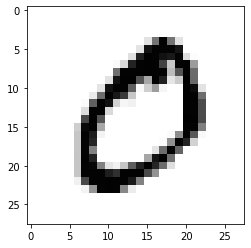

dig


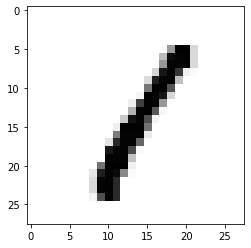

dig


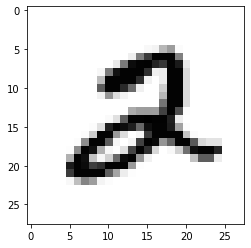

dig


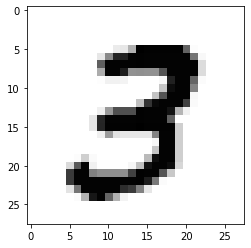

dig


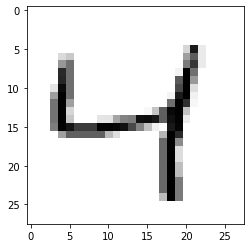

dig


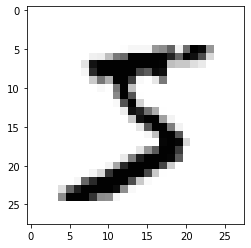

dig


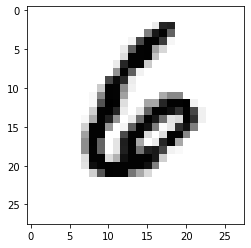

dig


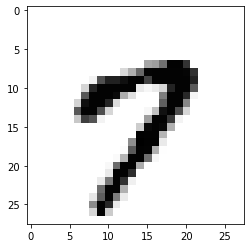

dig


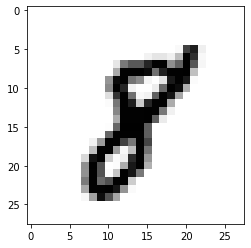

dig


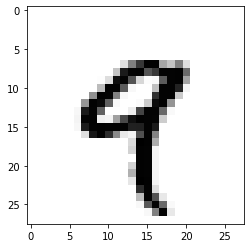

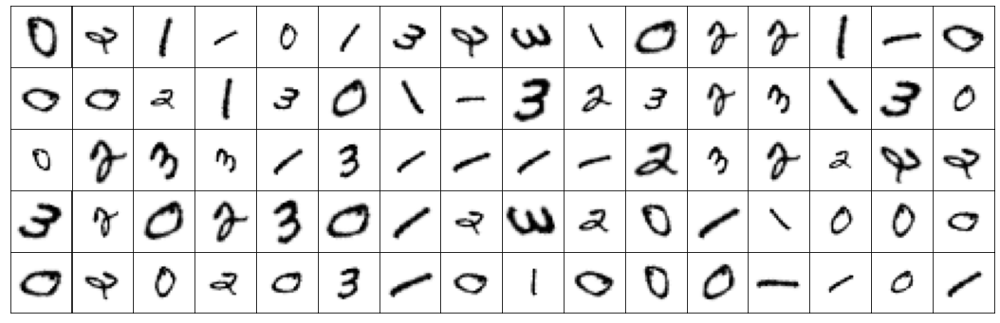

torch.Size([10, 784])
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])
dig


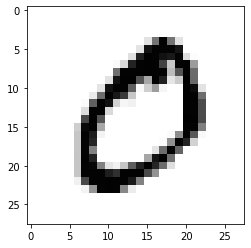

dig


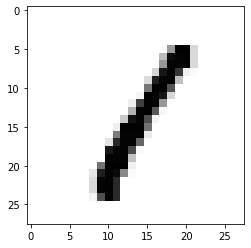

dig


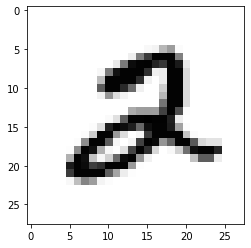

dig


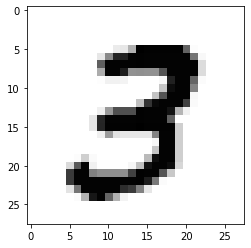

dig


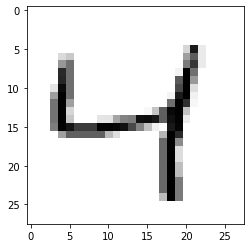

dig


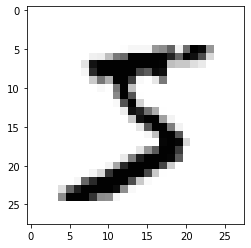

dig


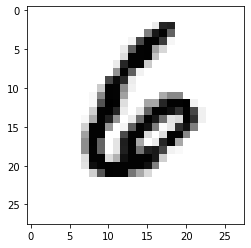

dig


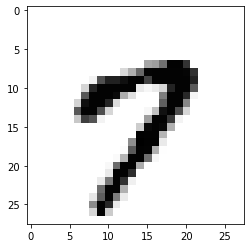

dig


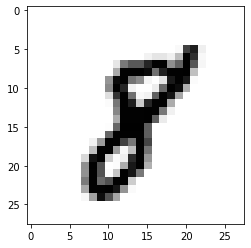

dig


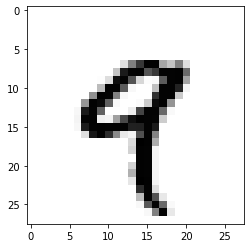

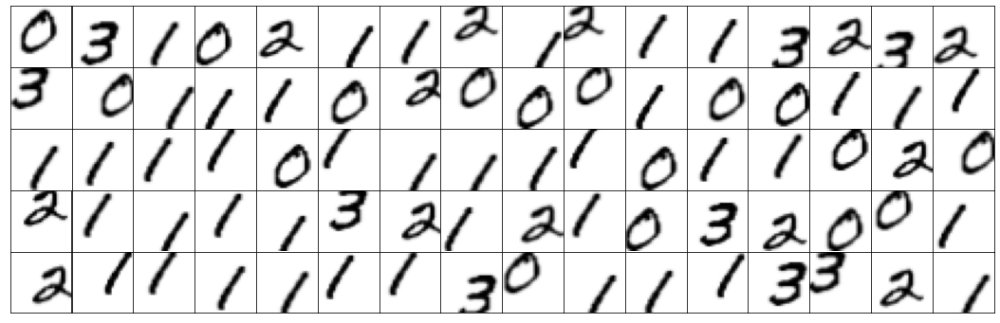

In [66]:
B = 100
dl, test_dl, dim, D, num_train_batches, num_test_batches = get_custom_dataloader(B,dr=[-75.0,75.0],ds=[0.5,1.0],cuda=True) # Rotation and Scaling
it = iter(dl)
y = next(it)
fig = plt.figure(figsize=(16,5))
for i in range(80):
    fig.add_subplot(5,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(y[i].reshape(dim,dim).cpu().numpy(), cmap="Greys")
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
# plt.tight_layout(h_pad=0.0,w_pad=0.0)
plt.show()
dl, test_dl, dim, D, num_train_batches, num_test_batches = get_custom_dataloader(B,dx=[-0.25,0.25],dy=[-0.25,0.25],cuda=True) # Horizontal and Vertical Translation
it = iter(dl)
y = next(it)
fig = plt.figure(figsize=(16,5))
for i in range(80):
    fig.add_subplot(5,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(y[i].reshape(dim,dim).cpu().numpy(), cmap="Greys")
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
# plt.tight_layout(h_pad=0.0,w_pad=0.0)
plt.show()

# Training the network

In [22]:
D

784

In [23]:
def create_w_learning_rate_adjuster(initial_lr, final_lr, warmup_steps):
    def adjust_w_learning_rate(optimizer, step):
        if step < warmup_steps:
            t = step / warmup_steps
            lr = (1-t)*initial_lr + t*final_lr
        else:
            lr = final_lr
        for param_group in optimizer.param_groups:
            param_group['lr'] = lr
    
    return adjust_w_learning_rate

def create_psi_learning_rate_adjuster(initial_lr, final_lr, warmup_steps):
    def adjust_psi_learning_rate(step):
        if step < warmup_steps:
            t = step / warmup_steps
            lr = (1-t)*initial_lr + t*final_lr
        else:
            lr = final_lr
        return lr
    
    return adjust_psi_learning_rate

**Initialization**

torch.Size([10, 784])
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])
dig


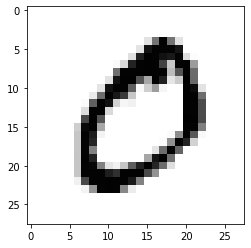

dig


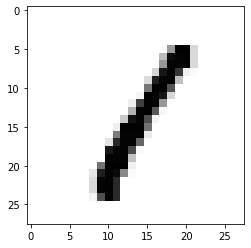

dig


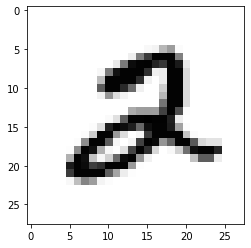

dig


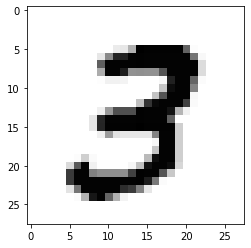

dig


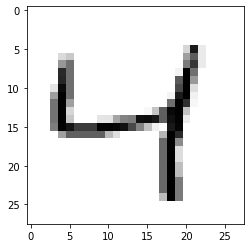

dig


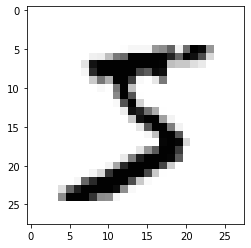

dig


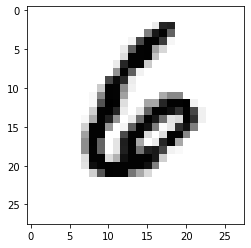

dig


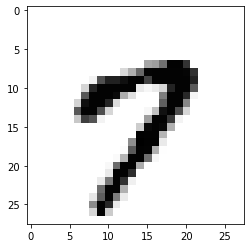

dig


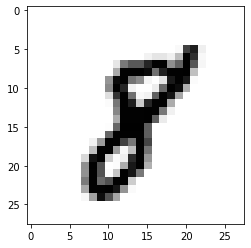

dig


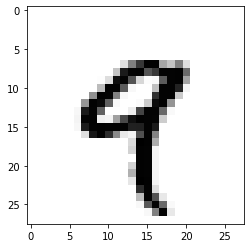

torch.Size([128, 2])


In [67]:
B = 100

# Initialize dataloader
#dl, test_dl, dim, D, num_train_batches, num_test_batches = get_MNIST_dataloader(B,cuda=True)
#dl, test_dl, dim, D, num_train_batches, num_test_batches = get_custom_dataloader(B,dr=[-75.0,75.0],ds=[0.5,1.0],cuda=True) # Rotation and Scaling
dl, test_dl, dim, D, num_train_batches, num_test_batches = get_custom_dataloader(B,dx=[-0.25,0.25],dy=[-0.25,0.25],cuda=True) # Horizontal and Vertical Translation
#dl, test_dl, dim, D, num_train_batches, num_test_batches = get_custom_dataloader(B,dr=[-75.0,75.0],ds=[0.5,1.0],dx=[-0.25,0.25],dy=[-0.25,0.25],cuda=True)

# Initialize omega
# L = 128
# o_max = 9.5
# multiplicity = 1
# n = 2
L = 128
o_max = 9.5
multiplicity = 1
n = 2
omega = initialize_omega(n,L,o_max,multiplicity)
print(omega.size())
assert omega.size()[0] == L

# Initialize sparse coding dictionary
K = 10
psi = torch.rand(D,K).cuda() # (D,K)
psi = f.normalize(psi, dim=0)

# Initialize weights
pre_w = torch.rand(D, L*2).cuda() # (D,J*2)
pre_w = lsc.orthogonalize(pre_w)
#w_manifold = geoopt.manifolds.Stiefel()
#w = geoopt.ManifoldParameter(pre_w,manifold=w_manifold,requires_grad=False)

# Initialize alpha
alpha_0 = 0.01
alpha = torch.ones(B,K).cuda()*alpha_0

k, m = None, None

epoch, T = 0, 0

In [ ]:
dl, test_dl, dim, D, num_train_batches, num_test_batches = get_custom_dataloader(B,train_l=200000,dx=[-0.25,0.25],dy=[-0.25,0.25],cuda=True) # Horizontal and Vertical Translation

dl.shape

KeyboardInterrupt: ignored

**Parameters**

In [8]:
# functions to run validation data and get score
"""def validate():
    with torch.no_grad():
        # Validation
        print('testing','reg',reg,'lr',lr)
        test_it = iter(test_dl)
        test_loss = 0.0
        test_snr = 0.0
        test_l1 = 0.0
        #normed_psi = f.normalize(psi,dim=0)
        T=0
        while T < num_test_batches:
            # Generate data was here before
            y = next(test_it)

            # Optimize alpha
            alpha[...] = alpha_0
            alpha = lsc.alpha_update_FISTA(y, model.psi, model.w, omega, alpha, s, lamb, lamb2, steps, k=k, m=m, N=N_samples, modified=modified, plot=False, map_est=map_est, adaptive=adaptive, adaptive_steps=adaptive_steps)

            # Calculate useful variables. started here before
            x, u, v, k_hat, m_hat, q, res, tres = lsc.compute_aux_var(y, model.psi, model.w, alpha, omega, s, k=k, m=m, N=N_samples, map_est=map_est)

            # Calculate error
            test_loss += -lsc.log_likelihood(x, y, u, v, model.psi, alpha, k_hat, m_hat, omega, lamb, lamb3, s, mean=True, N=N_samples, modified=modified, map_est=False)
            post = utils.get_distribution(k_hat, m_hat, unique_omega, N=N_samples) # (M,N,N)
            s_hat = utils.get_MAP(post) #started here before
            recon = lsc.reconstruct(x, model.w, s_hat, omega)
            torch_test_loss = torch_loss_fn(recon,y)
            torch_test_losses.append(torch_test_loss.item())
            test_snr += ((y**2).sum(dim=1)/((y-recon)**2).sum(dim=1)).mean()
            test_l1 += alpha.norm(dim=1, p=1).mean()
            T += 1

        test_loss /= num_test_batches
        test_snr /= num_test_batches
        test_l1 /= num_test_batches
        T = 0
        print("Epoch {}: Test loss - {:.3f}; SNR - {:.3f}; L1 - {:.3f}; ".format(epoch, test_loss, test_snr, test_l1))
        print(epoch,'mean test torch loss',np.mean(torch_test_losses))
        print('\n')"""
        
def validate():
    torch_test_losses=[]
    test_l1s=[]
    with torch.no_grad():
        print('testing','reg',reg,'lr',lr)
        test_it = iter(test_dl)
        test_loss = 0.0
        test_snr = 0.0
        test_l1 = 0.0
        #normed_psi = f.normalize(psi,dim=0)
        T=0
        while T < num_test_batches:
            # Generate data was here before
            y_val = next(test_it)
            out_val,alpha_generated = model(y_val.view(B,1,28,28))
            total_val_loss = torch_loss_fn(out_val,y_val)
            torch_test_losses.append(total_val_loss.item())
            test_l1s.append(alpha_generated.norm(dim=1, p=1).mean().item())
            T+=1
    print('val loss',np.mean(torch_test_losses))
    print('val l1',np.mean(test_l1s))
    
def validate_linear():
    torch_test_losses=[]
    test_l1s=[]
    with torch.no_grad():
        print('testing','reg',reg,'lr',lr)
        test_it = iter(test_dl)
        test_loss = 0.0
        test_snr = 0.0
        test_l1 = 0.0
        #normed_psi = f.normalize(psi,dim=0)
        T=0
        while T < num_test_batches:
            # Generate data was here before
            y_val = next(test_it)
            out_val,alpha_generated,s_generated = model(y_val)
            total_val_loss = torch_loss_fn(out_val,y_val)
            torch_test_losses.append(total_val_loss.item())
            test_l1s.append(alpha_generated.norm(dim=1, p=1).mean().item())
            T+=1
    print('val loss',np.mean(torch_test_losses))
    print('val l1',np.mean(test_l1s))
    
def validate_linear_occ():
    torch_test_losses=[]
    test_l1s=[]
    with torch.no_grad():
        print('testing','reg',reg,'lr',lr)
        test_it = iter(test_dl)
        test_loss = 0.0
        test_snr = 0.0
        test_l1 = 0.0
        #normed_psi = f.normalize(psi,dim=0)
        T=0
        while T < num_test_batches:
            # Generate data was here before
            y_prev = next(test_it)
            y_val=torch.zeros_like(y_prev)
            for i in range(len(y_prev)):
                y_val[i]=erase_img(y_prev[i].reshape(28,28),7,7).reshape(784)
            out_val,alpha_generated = model(y_val)
            total_val_loss = torch_loss_fn(out_val,y_prev)
            torch_test_losses.append(total_val_loss.item())
            test_l1s.append(alpha_generated.norm(dim=1, p=1).mean().item())
            T+=1
    print('val loss',np.mean(torch_test_losses))
    print('val l1',np.mean(test_l1s))
    
def validate_conv_occ():
    torch_test_losses=[]
    test_l1s=[]
    with torch.no_grad():
        print('testing','reg',reg,'lr',lr)
        test_it = iter(test_dl)
        test_loss = 0.0
        test_snr = 0.0
        test_l1 = 0.0
        #normed_psi = f.normalize(psi,dim=0)
        T=0
        while T < num_test_batches:
            # Generate data was here before
            y_prev = next(test_it)
            y_val=torch.zeros_like(y_prev)
            for i in range(len(y_prev)):
                y_val[i]=erase_img(y_prev[i].reshape(28,28),7,7).reshape(784)
            out_val,alpha_generated = model(y_val.view(B,1,28,28))
            total_val_loss = torch_loss_fn(out_val,y_val)
            torch_test_losses.append(total_val_loss.item())
            test_l1s.append(alpha_generated.norm(dim=1, p=1).mean().item())
            T+=1
    print('val loss',np.mean(torch_test_losses))
    print('val l1',np.mean(test_l1s))

In [9]:
def erase_img(img,h,w):
    i = torch.randint(0, 28-h+1, size=(1, )).item()
    j = torch.randint(0, 28-w+1, size=(1, )).item()
    return tvF.erase(img,i,j,h,w,0,False)

In [10]:
def conv3x3(in_planes, out_planes, stride=1, groups=1, dilation=1):
    """3x3 convolution with padding"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=dilation, groups=groups, bias=False, dilation=dilation)


def conv1x1(in_planes, out_planes, stride=1):
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None):
        super(BasicBlock, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        if groups != 1 or base_width != 64:
            raise ValueError('BasicBlock only supports groups=1 and base_width=64')
        if dilation > 1:
            raise NotImplementedError("Dilation > 1 not supported in BasicBlock")
        # Both self.conv1 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = norm_layer(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv3x3(planes, planes)
        self.bn2 = norm_layer(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out


class Bottleneck(nn.Module):
    # Bottleneck in torchvision places the stride for downsampling at 3x3 convolution(self.conv2)
    # while original implementation places the stride at the first 1x1 convolution(self.conv1)
    # according to "Deep residual learning for image recognition"https://arxiv.org/abs/1512.03385.
    # This variant is also known as ResNet V1.5 and improves accuracy according to
    # https://ngc.nvidia.com/catalog/model-scripts/nvidia:resnet_50_v1_5_for_pytorch.

    expansion = 4

    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None):
        super(Bottleneck, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        width = int(planes * (base_width / 64.)) * groups
        # Both self.conv2 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv1x1(inplanes, width)
        self.bn1 = norm_layer(width)
        self.conv2 = conv3x3(width, width, stride, groups, dilation)
        self.bn2 = norm_layer(width)
        self.conv3 = conv1x1(width, planes * self.expansion)
        self.bn3 = norm_layer(planes * self.expansion)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = self.relu(out)

        return out


class ResNet(nn.Module):

    def __init__(self, block, layers, num_classes=1000, zero_init_residual=False,
                 groups=1, width_per_group=64, replace_stride_with_dilation=None,
                 norm_layer=None):
        super(ResNet, self).__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        self._norm_layer = norm_layer

        self.inplanes = 64
        self.dilation = 1
        if replace_stride_with_dilation is None:
            # each element in the tuple indicates if we should replace
            # the 2x2 stride with a dilated convolution instead
            replace_stride_with_dilation = [False, False, False]
        if len(replace_stride_with_dilation) != 3:
            raise ValueError("replace_stride_with_dilation should be None "
                             "or a 3-element tuple, got {}".format(replace_stride_with_dilation))
        self.groups = groups
        self.base_width = width_per_group
        self.conv1 = nn.Conv2d(1, self.inplanes, kernel_size=7, stride=2, padding=3,
                               bias=False)
        self.bn1 = norm_layer(self.inplanes)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2,
                                       dilate=replace_stride_with_dilation[0])
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2,
                                       dilate=replace_stride_with_dilation[1])
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2,
                                       dilate=replace_stride_with_dilation[2])
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 * block.expansion, num_classes)

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, (nn.BatchNorm2d, nn.GroupNorm)):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck):
                    nn.init.constant_(m.bn3.weight, 0)
                elif isinstance(m, BasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)

    def _make_layer(self, block, planes, blocks, stride=1, dilate=False):
        norm_layer = self._norm_layer
        downsample = None
        previous_dilation = self.dilation
        if dilate:
            self.dilation *= stride
            stride = 1
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                conv1x1(self.inplanes, planes * block.expansion, stride),
                norm_layer(planes * block.expansion),
            )

        layers = []
        layers.append(block(self.inplanes, planes, stride, downsample, self.groups,
                            self.base_width, previous_dilation, norm_layer))
        self.inplanes = planes * block.expansion
        for _ in range(1, blocks):
            layers.append(block(self.inplanes, planes, groups=self.groups,
                                base_width=self.base_width, dilation=self.dilation,
                                norm_layer=norm_layer))

        return nn.Sequential(*layers)

    def _forward_impl(self, x):
        # See note [TorchScript super()]
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)

        return x

    def forward(self, x):
        return self._forward_impl(x)


def _resnet(arch, block, layers, pretrained, progress, **kwargs):
    model = ResNet(block, layers, **kwargs)
    if pretrained:
        state_dict = load_state_dict_from_url(model_urls[arch],
                                              progress=progress)
        model.load_state_dict(state_dict)
    return model


def resnet18(pretrained=False, progress=True, **kwargs):
    r"""ResNet-18 model from
    `"Deep Residual Learning for Image Recognition" <https://arxiv.org/pdf/1512.03385.pdf>`_

    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
        progress (bool): If True, displays a progress bar of the download to stderr
    """
    return _resnet('resnet18', BasicBlock, [2, 2, 2, 2], pretrained, progress,
                   **kwargs)

In [ ]:
# generate random transformations of random vector
class Model(nn.Module):
    def __init__(self,D,L,K):
        super(Model,self).__init__()
        # this initializes parameters
        pre_w = torch.rand(D, L*2).cuda() # (D,J*2)
        w = pre_w*.001
        w = torch.nn.init.xavier_uniform_(w)
        self.w = nn.Parameter(w, requires_grad=True).cuda()
        psi = torch.rand(D,K).cuda()*.0001 # (D,K)
        psi = torch.nn.init.xavier_uniform_(psi)
        self.psi = nn.Parameter(psi,requires_grad=True).cuda()
        alpha_multiplier = torch.rand(1,K).cuda()*.0001 # (D,K)
        alpha_multiplier = torch.nn.init.xavier_uniform_(alpha_multiplier)
        self.alpha_multiplier = nn.Parameter(alpha_multiplier,requires_grad=True).cuda()
        self.alpha_gen=alpha_generator_linear(K)
    
    # this computes the model output given alpha and s
    def forward(self,y,s):
        #x = torch.einsum('dk,bk->bd',self.psi,alpha_multiplied) # (B,D)
        out = lsc.reconstruct(y,self.w,s,omega)
        return out

def generate_samples(s_batch,w,y):
    y_repeat=y.reshape(1,-1).repeat(s_batch.shape[0],1)
    return lsc.reconstruct(y_repeat,w,s_batch,omega)

def get_data(num_samples):
    w = torch.empty(D, L*2).cuda()
    nn.init.orthogonal_(w)
    y=torch.rand(784)-.5
    y=y.cuda()
    outputs=[]
    for batch_num in range(int(num_samples/256)):
        s_batch=(torch.rand(256,2)*2-1).cuda() # random uniform [-1,1]
        outputs.append(generate_samples(s_batch,w,y))
    return torch.cat(outputs[:-5]),torch.cat(outputs[-5:]),y,w

def get_image_data(num_samples):
    y=dl[0][0] #zero
    w = torch.empty(D, L*2).cuda()
    nn.init.orthogonal_(w)
    outputs=[]
    for batch_num in range(int(num_samples/256)):
        s_batch=(torch.rand(256,2)*2-1).cuda() # random uniform [-1,1]
        outputs.append(generate_samples(s_batch,w,y))
    return torch.cat(outputs[:-5]),torch.cat(outputs[-5:]),y,w

outputs,outputs_val,y_true,w_true=get_data(60000)

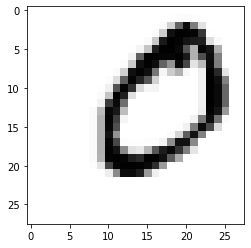

In [ ]:
plt.imshow(dl[0][0].reshape(dim,dim).cpu(), cmap="Greys")

In [ ]:
dataset=torch.utils.data.TensorDataset(outputs)
dataloader=torch.utils.data.DataLoader(dataset,batch_size=64)
dataset_val=torch.utils.data.TensorDataset(outputs_val)
dataloader_val=torch.utils.data.DataLoader(dataset_val,batch_size=64)

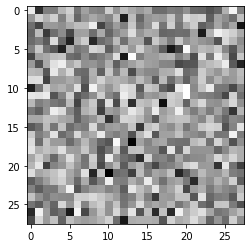

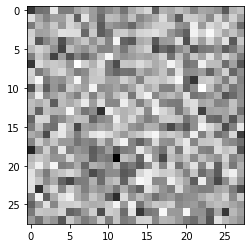

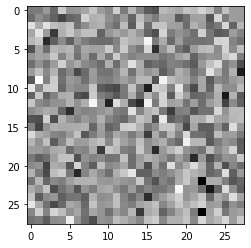

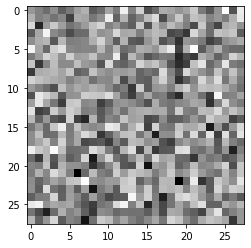

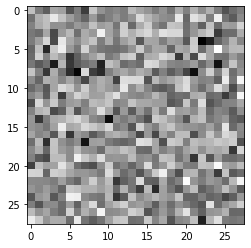

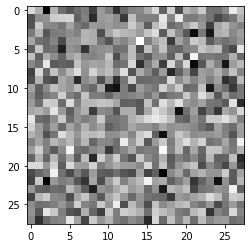

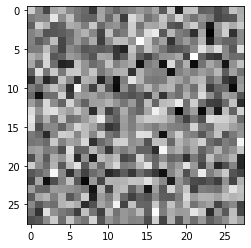

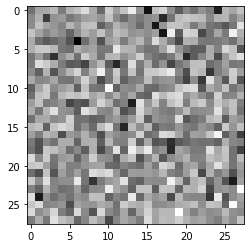

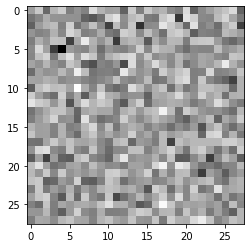

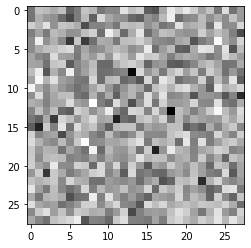

In [ ]:
data=next(iter(dataloader))[0]
for i in range(10):
    plt.imshow(data[i].reshape(dim,dim).cpu(), cmap="Greys")
    plt.show()

In [ ]:
next(iter(dataloader))[0].shape

torch.Size([64, 784])

In [ ]:
dataset[0][0].shape

torch.Size([784])

In [16]:
# train on generated images of translation but with random template all 10 digits
class alpha_generator_linear(nn.Module):
    def __init__(self,K,s_size=2):
        super(alpha_generator_linear,self).__init__()
        self.fc1 = nn.Linear(784, 220)
        self.bn1 = nn.BatchNorm1d(220)
        self.fc2 = nn.Linear(220, 220)
        self.bn2 = nn.BatchNorm1d(220)
        self.fc3 = nn.Linear(220, 120)
        self.bn3 = nn.BatchNorm1d(120)
        self.fc4 = nn.Linear(120, K+s_size)
        
    def forward(self,x):
        x = f.relu(self.bn1(self.fc1(x)))
        x = f.relu(self.bn2(self.fc2(x)))
        x = f.relu(self.bn3(self.fc3(x)))
        x = self.fc4(x)
        alpha_generated = x[:,:K]
        s_generated = x[:,K:]
        return alpha_generated,s_generated

class Model(nn.Module):
    def __init__(self,D,L,K):
        super(Model,self).__init__()
        # this initializes parameters
        pre_w = torch.rand(D, L*2).cuda() # (D,J*2)
        w = pre_w*.001
        w = torch.nn.init.xavier_uniform_(w)
        self.w = nn.Parameter(w, requires_grad=True).cuda()
        psi = torch.rand(D,K).cuda()*.0001 # (D,K)
        self.psi = torch.nn.init.xavier_uniform_(psi).cuda()
        #self.psi = nn.Parameter(psi,requires_grad=True).cuda()
        
        self.alpha_gen=alpha_generator_linear(K)
    
    # this computes the model output given alpha and s
    def forward(self,y):
        with torch.no_grad():
            self.psi += f.normalize(self.psi,dim=0)-self.psi # TODO change this
        alpha_generated,s_generated=self.alpha_gen(y)
        #print('alpha',alpha_generated.shape)
        #print('s',s_generated.shape)
        #print(s_generated[:5])
        #print(alpha_generated.shape,s_generated.shape)
        #print(B,K,2)
        x = torch.einsum('dk,bk->bd',self.psi,alpha_generated) # (B,D)
        out = lsc.reconstruct(x,self.w,s_generated,omega)
        return out,alpha_generated,s_generated

    def forward_s(self,alpha,s):
        x = torch.einsum('dk,bk->bd',self.psi,alpha) # (B,D)
        out = lsc.reconstruct(x,self.w,s,omega)
        return out
lr=.003

dataset=torch.utils.data.TensorDataset(dl.reshape(100*600,784))
dataloader=torch.utils.data.DataLoader(dataset,batch_size=64)
dataset_val=torch.utils.data.TensorDataset(test_dl.reshape(100*100,784))
dataloader_val=torch.utils.data.DataLoader(dataset_val,batch_size=64)

model=Model(D,L,K).cuda()
geotorch.orthogonal(model,"w")
shuffle=False



torch_loss_fn = torch.nn.MSELoss()
model_optimizer=torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(model_optimizer,'min',verbose=True,patience=2,threshold=1e-2,cooldown=3)

for epoch in range(30):
    if epoch==8:
        for g in model_optimizer.param_groups:
            g['lr'] = 0.0001
    # Training
    losses=[]
    torch_test_losses=[]
    for i,data in enumerate(dataloader):
        y=data[0].cuda()
        if y.shape[0]!=64: continue
        out,alpha_generated,s_generated = model(y)
        pred_loss = torch_loss_fn(out,y)
        model_optimizer.zero_grad()
        pred_loss.backward()
        model_optimizer.step()

        losses.append(pred_loss.item())
        if np.isnan(pred_loss.item()):
            print('nan')
            break
        #print(total_loss.item())
    scheduler.step(np.mean(losses))
    if (epoch+1)%1==0:
        val_losses=[]
        with torch.no_grad():
            model.eval()
            for i,data in enumerate(dataloader_val):
                y=data[0].cuda()  
                if y.shape[0]!=64: continue  
                out,alpha_generated,s_generated = model(y)
                pred_loss = torch_loss_fn(out,y)
                val_losses.append(pred_loss.item())
        print(epoch,'mean loss',np.mean(losses))
        print('val loss',np.mean(val_losses),'\n')
        model.train()


0 mean loss 0.00046787428862331764
val loss 0.0003638694352747944 

1 mean loss 0.00034319866141637346
val loss 0.0003191743554242958 

2 mean loss 0.00032035797257165213
val loss 0.00030160846225230786 

3 mean loss 0.00030832674286354096
val loss 0.0002914610772560804 

4 mean loss 0.0002997986367394752
val loss 0.0002849857535180397 

5 mean loss 0.00029298744474765286
val loss 0.00027936577680520713 

6 mean loss 0.0002875771642992573
val loss 0.00027451863962386805 

7 mean loss 0.00028273589948710085
val loss 0.00027068301763695973 

8 mean loss 0.00025093204319092424
val loss 0.00024046716330653557 

9 mean loss 0.000247775508488927
val loss 0.00023974948467534536 

10 mean loss 0.00024700028342373764
val loss 0.00023933142400869072 

11 mean loss 0.0002464334466456105
val loss 0.0002389905875577078 

Epoch    13: reducing learning rate of group 0 to 1.0000e-05.
12 mean loss 0.00024595023883907215
val loss 0.00023868450742343275 

13 mean loss 0.0002445605289468814
val loss 0.00

KeyboardInterrupt: ignored

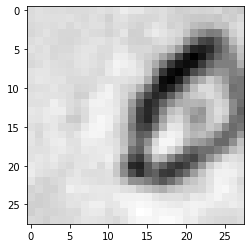

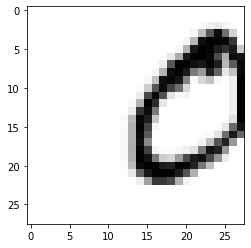

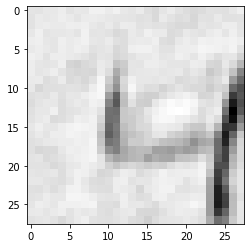

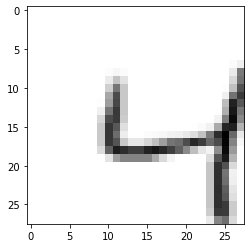

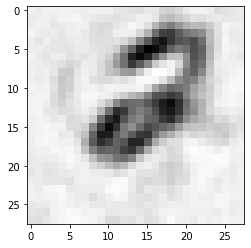

...

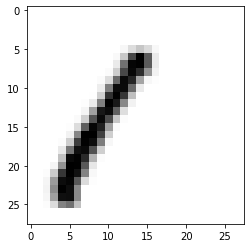

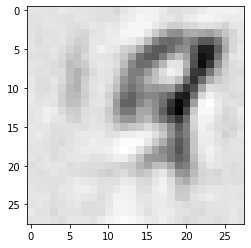

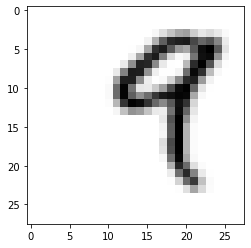

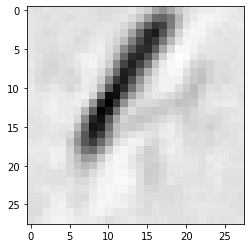

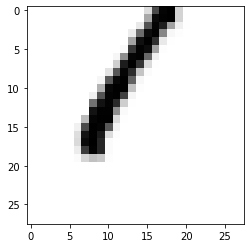

In [17]:
data=next(iter(dataloader))[0]
out,alpha_generated,s=model(data)
for i in range(20):
    plt.imshow(out[i].reshape(dim,dim).cpu().detach(), cmap="Greys")
    plt.show()
    plt.imshow(data[i].reshape(dim,dim).cpu().detach(), cmap="Greys")
    plt.show()
    print(' ')

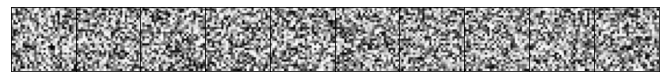

In [18]:
plot_psi(model.psi.detach(),show=True,rgb=False)

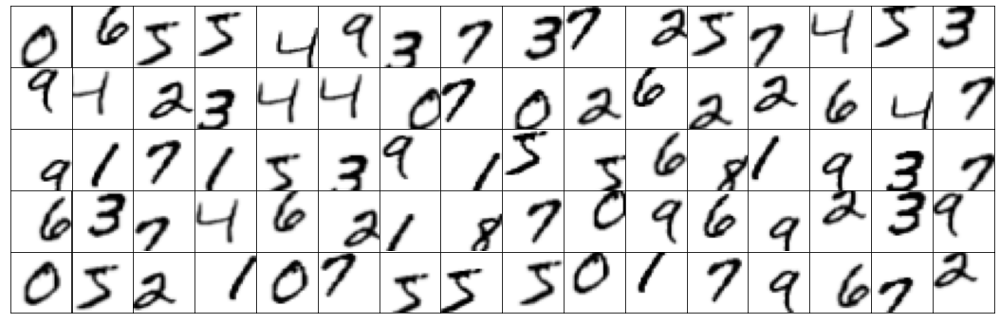

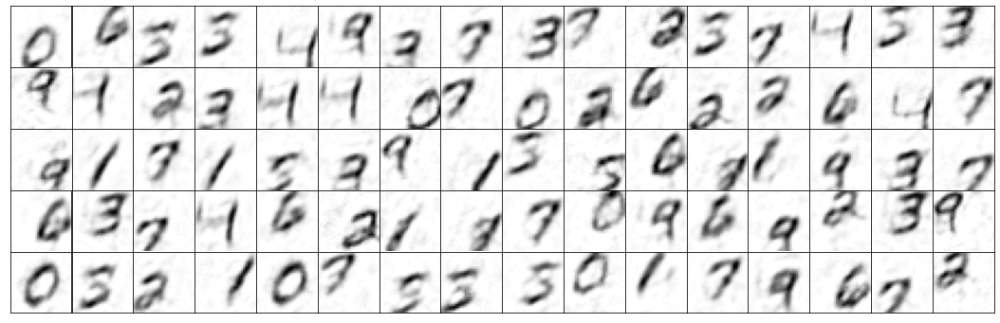

[0, 1]
torch.Size([100, 2])
new torch.Size([100, 784])
prev torch.Size([100, 784])


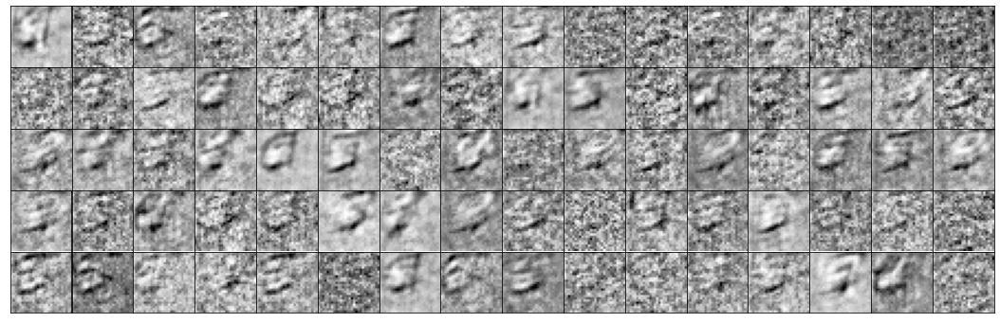

[0, 2]
torch.Size([100, 2])
new torch.Size([100, 784])
prev torch.Size([100, 784])


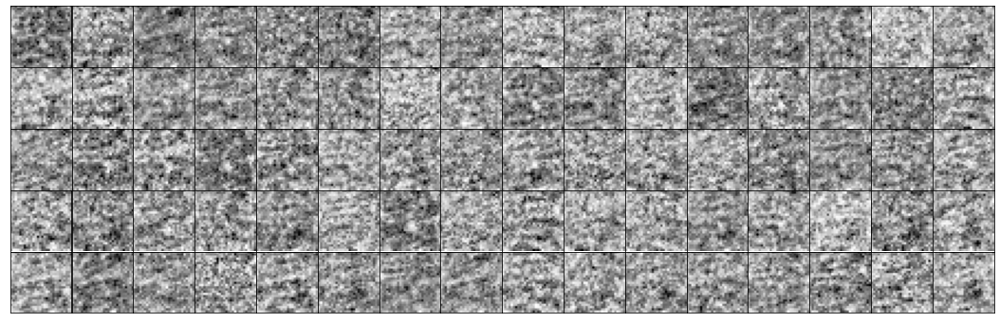

[0, -1]
torch.Size([100, 2])
new torch.Size([100, 784])
prev torch.Size([100, 784])


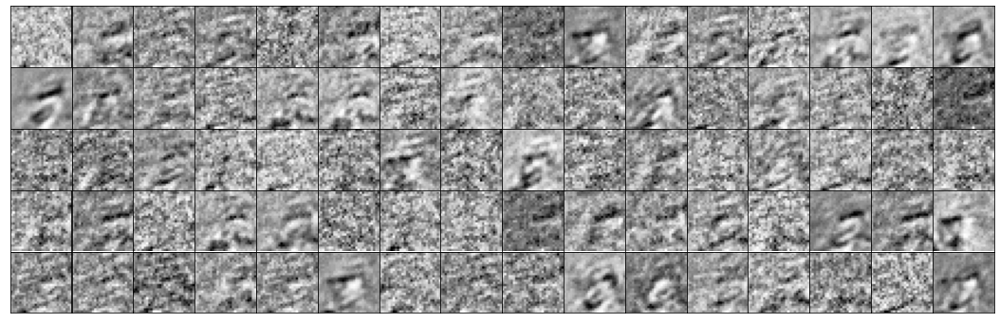

[0, -2]
torch.Size([100, 2])
new torch.Size([100, 784])
prev torch.Size([100, 784])


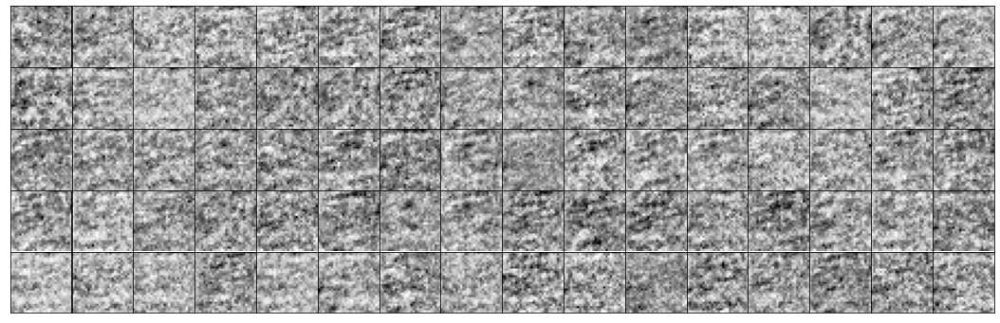

[1, 0]
torch.Size([100, 2])
new torch.Size([100, 784])
prev torch.Size([100, 784])


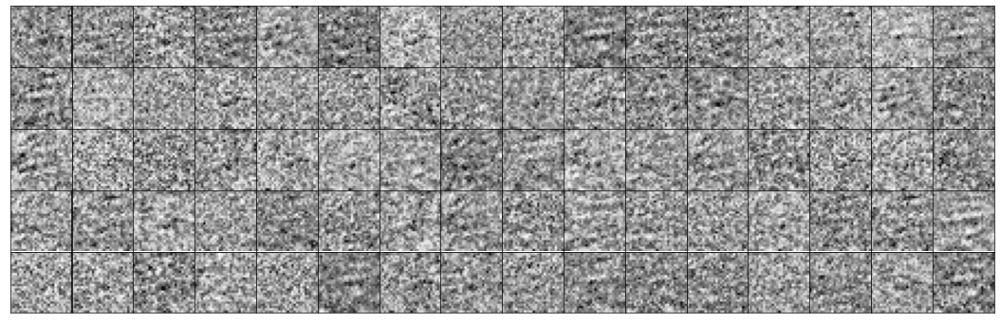

[2, 0]
torch.Size([100, 2])
new torch.Size([100, 784])
prev torch.Size([100, 784])


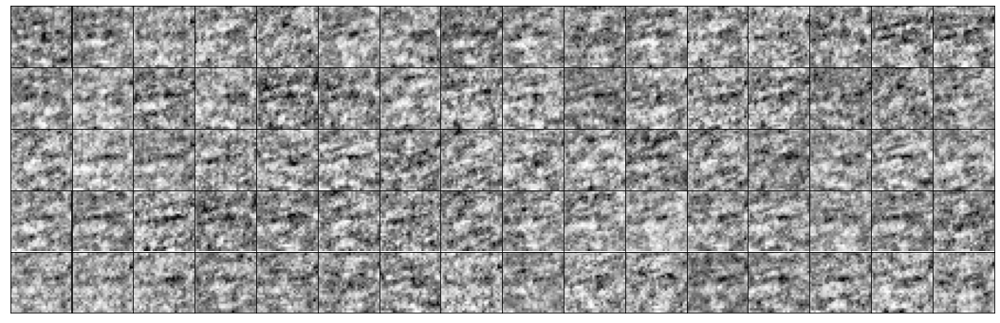

[-1, 0]
torch.Size([100, 2])
new torch.Size([100, 784])
prev torch.Size([100, 784])


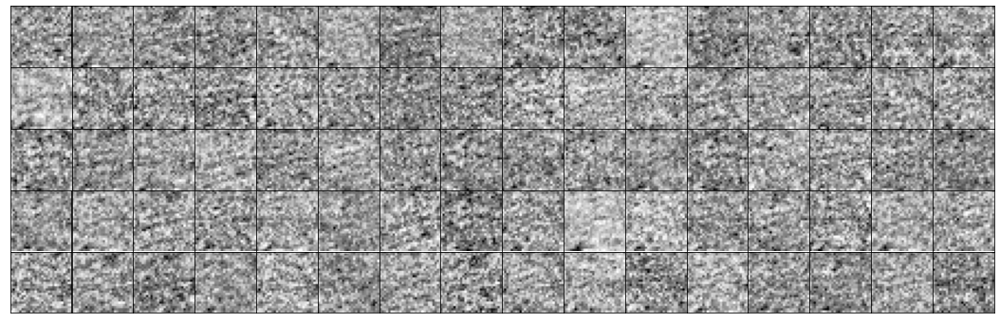

[-2, 0]
torch.Size([100, 2])
new torch.Size([100, 784])
prev torch.Size([100, 784])


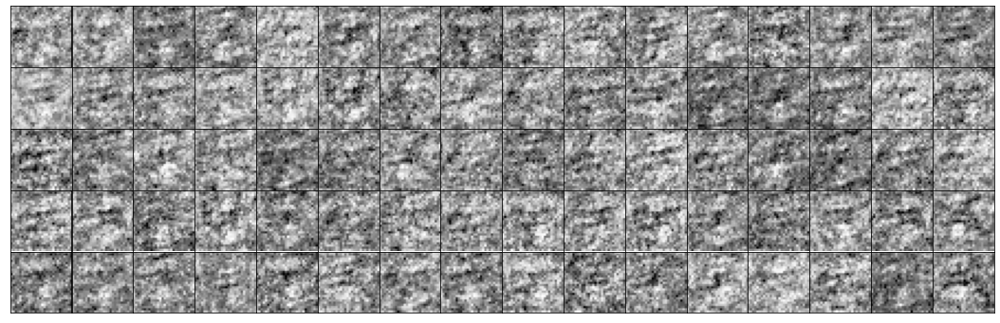

's_temp=torch.Tensor([.8,.7]).repeat(out_val.shape[0],1).cuda()\nprint(s_temp.shape)\nout_new = model.forward_s(alpha_generated,s_temp)\nprint(\'new\',out_new.shape)\nprint(\'prev\',out_val.shape)\nfig = plt.figure(figsize=(16,5))\nfor i in range(80):\n    fig.add_subplot(5,16,i+1)\n    plt.xticks([])\n    plt.yticks([])\n    plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")\nplt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)\n# plt.tight_layout(h_pad=0.0,w_pad=0.0)\nplt.show()\n\ns_temp=torch.Tensor([-.4,-.2]).repeat(out_val.shape[0],1).cuda()\nprint(s_temp.shape)\nout_new = model.forward_s(alpha_generated,s_temp)\nprint(\'new\',out_new.shape)\nprint(\'prev\',out_val.shape)\nfig = plt.figure(figsize=(16,5))\nfor i in range(80):\n    fig.add_subplot(5,16,i+1)\n    plt.xticks([])\n    plt.yticks([])\n    plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")\nplt.subplots_adjust(left=0.05, right=0.95,

In [19]:
#l1 0000006
test_it = iter(test_dl)
y_val = next(test_it)
out_val,alpha_generated,s_generated = model(y_val)
out_val=f.relu(out_val)
fig = plt.figure(figsize=(16,5))
for i in range(80):
    fig.add_subplot(5,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(y_val[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
# plt.tight_layout(h_pad=0.0,w_pad=0.0)
plt.show()
fig = plt.figure(figsize=(16,5))
for i in range(80):
    fig.add_subplot(5,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(out_val[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
# plt.tight_layout(h_pad=0.0,w_pad=0.0)
plt.show()
#s_temp=torch.zeros(out_val.shape[0],2).cuda()
"""for i in range(80):
    if i%16==0: print('\n')
    print(alpha_generated[i])"""

for num in range(1,3):
    print([0,num])
    s_temp=s_generated+torch.Tensor([0,num]).cuda()
    print(s_temp.shape)
    out_new = model.forward_s(alpha_generated,s_temp)
    print('new',out_new.shape)
    print('prev',out_val.shape)
    fig = plt.figure(figsize=(16,5))
    for i in range(80):
        fig.add_subplot(5,16,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
    # plt.tight_layout(h_pad=0.0,w_pad=0.0)
    plt.show()

for num in range(1,3):
    print([0,-num])
    s_temp=s_generated+torch.Tensor([0,-num]).cuda()
    print(s_temp.shape)
    out_new = model.forward_s(alpha_generated,s_temp)
    print('new',out_new.shape)
    print('prev',out_val.shape)
    fig = plt.figure(figsize=(16,5))
    for i in range(80):
        fig.add_subplot(5,16,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
    # plt.tight_layout(h_pad=0.0,w_pad=0.0)
    plt.show()

for num in range(1,3):
    print([num,0])
    s_temp=s_generated+torch.Tensor([num,0]).cuda()
    print(s_temp.shape)
    out_new = model.forward_s(alpha_generated,s_temp)
    print('new',out_new.shape)
    print('prev',out_val.shape)
    fig = plt.figure(figsize=(16,5))
    for i in range(80):
        fig.add_subplot(5,16,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
    # plt.tight_layout(h_pad=0.0,w_pad=0.0)
    plt.show()

for num in range(1,3):
    print([-num,0])
    s_temp=s_generated+torch.Tensor([-num,0]).cuda()
    print(s_temp.shape)
    out_new = model.forward_s(alpha_generated,s_temp)
    print('new',out_new.shape)
    print('prev',out_val.shape)
    fig = plt.figure(figsize=(16,5))
    for i in range(80):
        fig.add_subplot(5,16,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
    # plt.tight_layout(h_pad=0.0,w_pad=0.0)
    plt.show()


"""s_temp=torch.Tensor([.8,.7]).repeat(out_val.shape[0],1).cuda()
print(s_temp.shape)
out_new = model.forward_s(alpha_generated,s_temp)
print('new',out_new.shape)
print('prev',out_val.shape)
fig = plt.figure(figsize=(16,5))
for i in range(80):
    fig.add_subplot(5,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
# plt.tight_layout(h_pad=0.0,w_pad=0.0)
plt.show()

s_temp=torch.Tensor([-.4,-.2]).repeat(out_val.shape[0],1).cuda()
print(s_temp.shape)
out_new = model.forward_s(alpha_generated,s_temp)
print('new',out_new.shape)
print('prev',out_val.shape)
fig = plt.figure(figsize=(16,5))
for i in range(80):
    fig.add_subplot(5,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
# plt.tight_layout(h_pad=0.0,w_pad=0.0)
plt.show()

s_temp=torch.Tensor([0,0]).repeat(out_val.shape[0],1).cuda()
print(s_temp.shape)
out_new = model.forward_s(alpha_generated,s_temp)
print('new',out_new.shape)
print('prev',out_val.shape)
fig = plt.figure(figsize=(16,5))
for i in range(80):
    fig.add_subplot(5,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
# plt.tight_layout(h_pad=0.0,w_pad=0.0)
plt.show()

s_temp=torch.Tensor([-.1,.1]).repeat(out_val.shape[0],1).cuda()
print(s_temp.shape)
out_new = model.forward_s(alpha_generated,s_temp)
print('new',out_new.shape)
print('prev',out_val.shape)
fig = plt.figure(figsize=(16,5))
for i in range(80):
    fig.add_subplot(5,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
# plt.tight_layout(h_pad=0.0,w_pad=0.0)
plt.show()"""

In [37]:
# train on generated images of translation but with random template
class alpha_generator_linear(nn.Module):
    def __init__(self,s_size=2):
        super(alpha_generator_linear,self).__init__()
        self.fc1 = nn.Linear(784, 220)
        self.bn1 = nn.BatchNorm1d(220)
        self.fc2 = nn.Linear(220, 220)
        self.bn2 = nn.BatchNorm1d(220)
        self.fc3 = nn.Linear(220, 120)
        self.bn3 = nn.BatchNorm1d(120)
        self.fc4 = nn.Linear(120, s_size)
        
    def forward(self,x):
        x = f.relu(self.bn1(self.fc1(x)))
        x = f.relu(self.bn2(self.fc2(x)))
        x = f.relu(self.bn3(self.fc3(x)))
        x = self.fc4(x)
        return x

class Model(nn.Module):
    def __init__(self,D,L,K,y_true):
        super(Model,self).__init__()
        # this initializes parameters
        pre_w = torch.rand(D, L*2).cuda() # (D,J*2)
        w = pre_w*.001
        w = torch.nn.init.xavier_uniform_(w)
        self.w = nn.Parameter(w, requires_grad=True).cuda()
        self.alpha_gen=alpha_generator_linear()
        self.y_true=y_true.reshape(1,-1).repeat(64,1)
    
    # this computes the model output given alpha and s
    def forward(self,y):
        s_generated=self.alpha_gen(y)
        out = lsc.reconstruct(self.y_true,self.w,s_generated,omega)
        return out,s_generated

    def forward_s(self,alpha,s):
        #x = torch.einsum('dk,bk->bd',self.psi,alpha) # (B,D)
        out = lsc.reconstruct(self.y_true,self.w,s,omega)
        return out
lr=.003

dataset=torch.utils.data.TensorDataset(dl.reshape(100*600,784))
dataloader=torch.utils.data.DataLoader(dataset,batch_size=64)
dataset_val=torch.utils.data.TensorDataset(test_dl.reshape(100*100,784))
dataloader_val=torch.utils.data.DataLoader(dataset_val,batch_size=64)

model=Model(D,L,K,(torch.rand(dataset[0][0].shape)-.5).cuda()).cuda()
geotorch.orthogonal(model,"w")
shuffle=False



torch_loss_fn = torch.nn.MSELoss()
model_optimizer=torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(model_optimizer,'min',verbose=True,patience=2,threshold=1e-2,cooldown=3)

for epoch in range(30):
    if epoch==8:
        for g in model_optimizer.param_groups:
            g['lr'] = 0.0001
    # Training
    losses=[]
    torch_test_losses=[]
    for i,data in enumerate(dataloader):
        y=data[0].cuda()
        if y.shape[0]!=64: continue
        out,s_generated = model(y)
        pred_loss = torch_loss_fn(out,y)
        model_optimizer.zero_grad()
        pred_loss.backward()
        model_optimizer.step()

        losses.append(pred_loss.item())
        if np.isnan(pred_loss.item()):
            print('nan')
            break
        #print(total_loss.item())
    scheduler.step(np.mean(losses))
    if (epoch+1)%1==0:
        val_losses=[]
        with torch.no_grad():
            model.eval()
            for i,data in enumerate(dataloader_val):
                y=data[0].cuda()  
                if y.shape[0]!=64: continue  
                out,s_generated = model(y)
                pred_loss = torch_loss_fn(out,y)
                val_losses.append(pred_loss.item())
        print(epoch,'mean loss',np.mean(losses))
        print('val loss',np.mean(val_losses),'\n')
        model.train()


0 mean loss 0.0008605664766236063
val loss 0.0003384512599903899 

1 mean loss 0.0003195657651107848
val loss 0.0001969442432126902 

2 mean loss 0.0002001617293440356
val loss 0.00014627599086499034 

3 mean loss 0.00015825240085971925
val loss 0.0001345072806333729 

4 mean loss 0.00013807210492903493
val loss 0.00011016500936350964 

5 mean loss 0.00011962551128848783
val loss 0.00010204975660599303 

6 mean loss 0.00010593639271081104
val loss 8.596857547579416e-05 

7 mean loss 9.967988716428349e-05
val loss 8.060506453871196e-05 

8 mean loss 6.141099462919523e-05
val loss 5.8247612147309926e-05 

9 mean loss 5.94829762859353e-05
val loss 5.8628079060350174e-05 

10 mean loss 5.862949286875655e-05
val loss 5.8608467999221874e-05 

11 mean loss 5.7986769712469946e-05
val loss 5.8801821675539635e-05 

12 mean loss 5.742988892144592e-05
val loss 5.8773537043285054e-05 

13 mean loss 5.692358434456475e-05
val loss 5.8616183965708704e-05 

14 mean loss 5.6528059883633816e-05
val loss 

KeyboardInterrupt: ignored

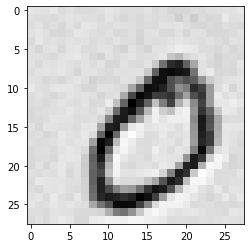

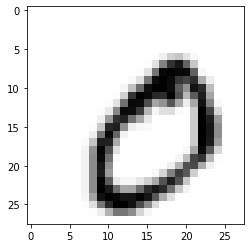

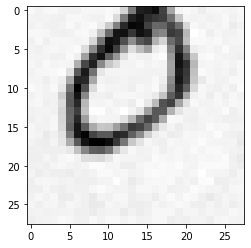

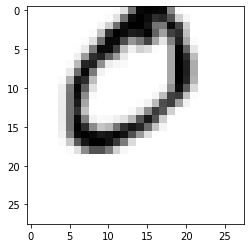

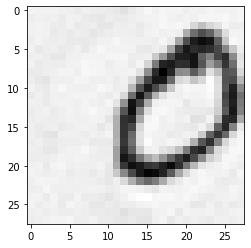

...

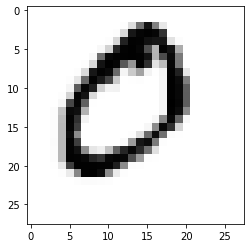

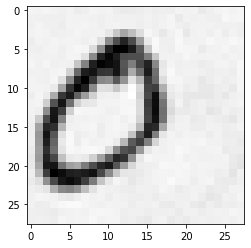

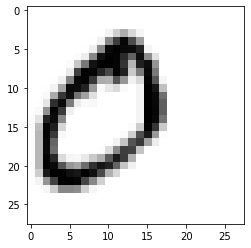

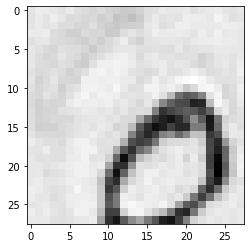

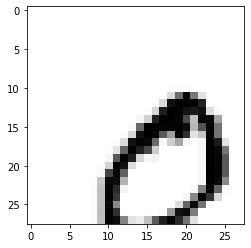

In [38]:
data=next(iter(dataloader))[0]
out,s=model(data)
for i in range(20):
    plt.imshow(out[i].reshape(dim,dim).cpu().detach(), cmap="Greys")
    plt.show()
    plt.imshow(data[i].reshape(dim,dim).cpu().detach(), cmap="Greys")
    plt.show()
    print(' ')

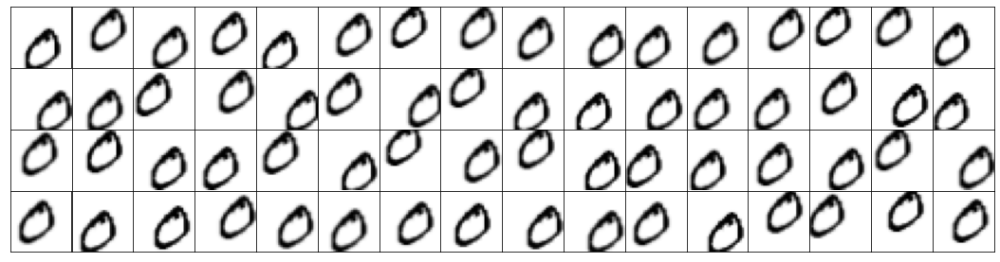

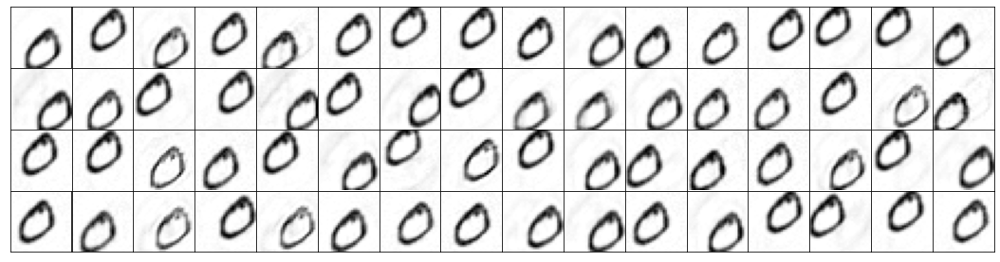

[0, 1]
torch.Size([64, 2])
new torch.Size([64, 784])
prev torch.Size([64, 784])


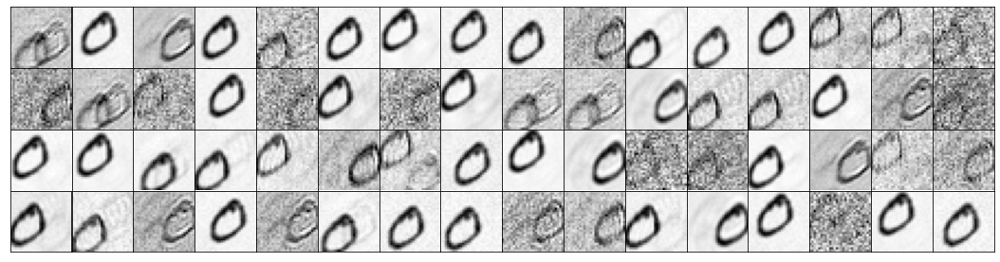

[0, 2]
torch.Size([64, 2])
new torch.Size([64, 784])
prev torch.Size([64, 784])


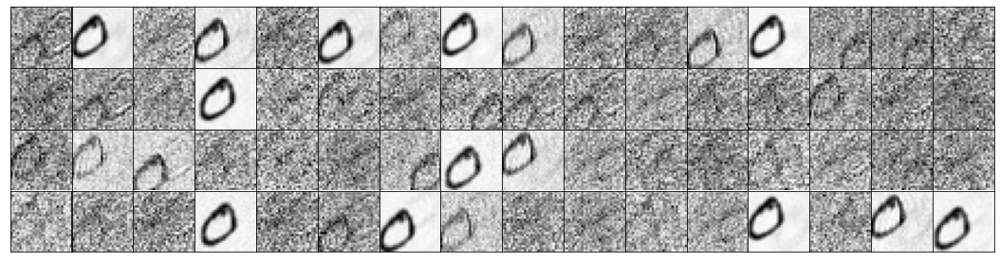

[0, -1]
torch.Size([64, 2])
new torch.Size([64, 784])
prev torch.Size([64, 784])


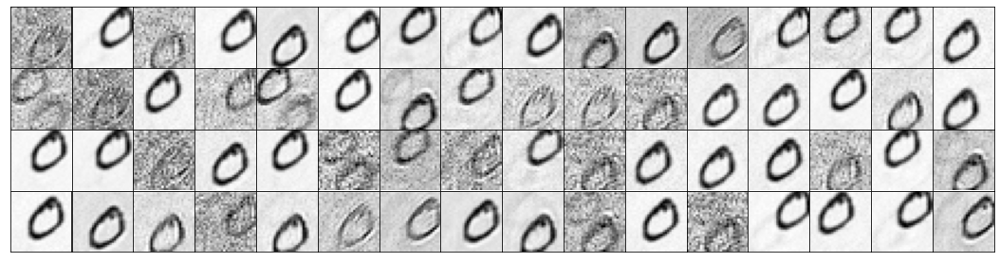

[0, -2]
torch.Size([64, 2])
new torch.Size([64, 784])
prev torch.Size([64, 784])


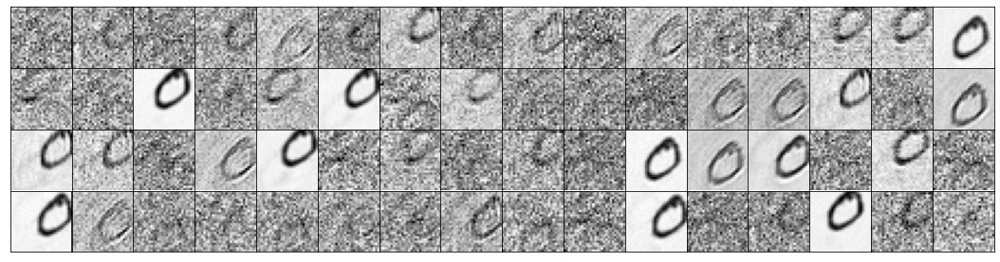

[1, 0]
torch.Size([64, 2])
new torch.Size([64, 784])
prev torch.Size([64, 784])


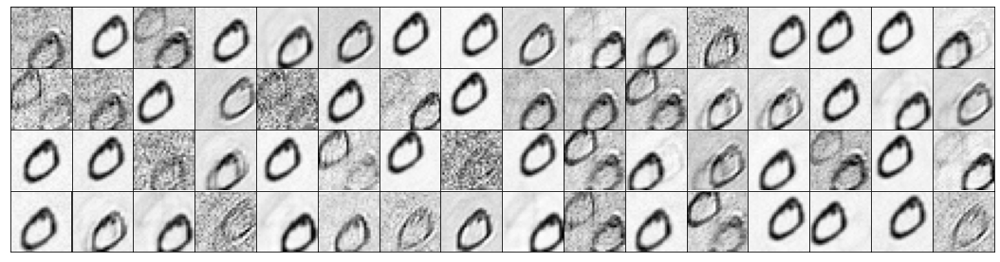

[2, 0]
torch.Size([64, 2])
new torch.Size([64, 784])
prev torch.Size([64, 784])


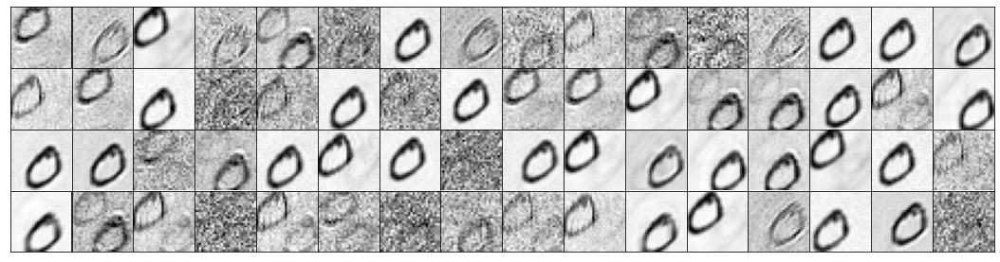

[-1, 0]
torch.Size([64, 2])
new torch.Size([64, 784])
prev torch.Size([64, 784])


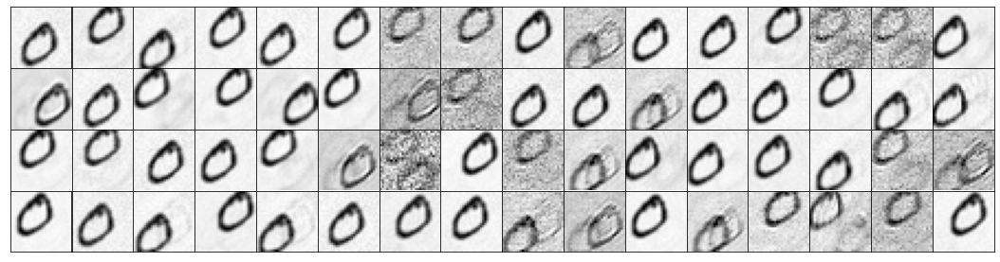

[-2, 0]
torch.Size([64, 2])
new torch.Size([64, 784])
prev torch.Size([64, 784])


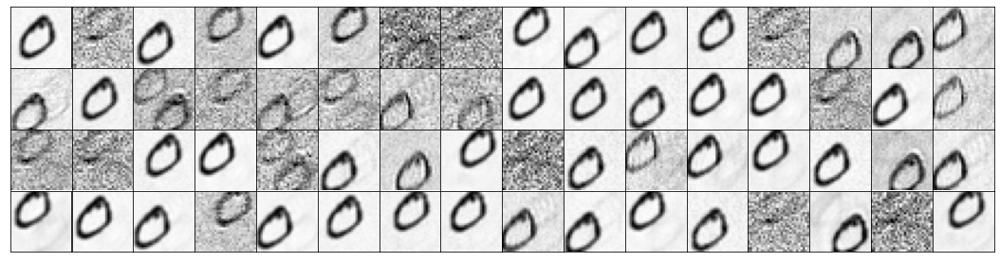

's_temp=torch.Tensor([.8,.7]).repeat(out_val.shape[0],1).cuda()\nprint(s_temp.shape)\nout_new = model.forward_s(alpha_generated,s_temp)\nprint(\'new\',out_new.shape)\nprint(\'prev\',out_val.shape)\nfig = plt.figure(figsize=(16,5))\nfor i in range(80):\n    fig.add_subplot(5,16,i+1)\n    plt.xticks([])\n    plt.yticks([])\n    plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")\nplt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)\n# plt.tight_layout(h_pad=0.0,w_pad=0.0)\nplt.show()\n\ns_temp=torch.Tensor([-.4,-.2]).repeat(out_val.shape[0],1).cuda()\nprint(s_temp.shape)\nout_new = model.forward_s(alpha_generated,s_temp)\nprint(\'new\',out_new.shape)\nprint(\'prev\',out_val.shape)\nfig = plt.figure(figsize=(16,5))\nfor i in range(80):\n    fig.add_subplot(5,16,i+1)\n    plt.xticks([])\n    plt.yticks([])\n    plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")\nplt.subplots_adjust(left=0.05, right=0.95,

In [39]:
#l1 0000006
test_it = iter(dataloader_val)
y_val = next(test_it)
y_val=dataset_val[:64]
out_val,s_generated = model(y_val[0])
out_val=f.relu(out_val)
fig = plt.figure(figsize=(16,5))
for i in range(64):
    fig.add_subplot(5,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(y_val[0][i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
# plt.tight_layout(h_pad=0.0,w_pad=0.0)
plt.show()
fig = plt.figure(figsize=(16,5))
for i in range(64):
    fig.add_subplot(5,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(out_val[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
# plt.tight_layout(h_pad=0.0,w_pad=0.0)
plt.show()
#s_temp=torch.zeros(out_val.shape[0],2).cuda()
"""for i in range(80):
    if i%16==0: print('\n')
    print(alpha_generated[i])"""

for num in range(1,3):
    print([0,num])
    s_temp=s_generated+torch.Tensor([0,num]).cuda()
    print(s_temp.shape)
    out_new = model.forward_s(alpha_generated,s_temp)
    print('new',out_new.shape)
    print('prev',out_val.shape)
    fig = plt.figure(figsize=(16,5))
    for i in range(64):
        fig.add_subplot(5,16,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
    # plt.tight_layout(h_pad=0.0,w_pad=0.0)
    plt.show()

for num in range(1,3):
    print([0,-num])
    s_temp=s_generated+torch.Tensor([0,-num]).cuda()
    print(s_temp.shape)
    out_new = model.forward_s(alpha_generated,s_temp)
    print('new',out_new.shape)
    print('prev',out_val.shape)
    fig = plt.figure(figsize=(16,5))
    for i in range(64):
        fig.add_subplot(5,16,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
    # plt.tight_layout(h_pad=0.0,w_pad=0.0)
    plt.show()

for num in range(1,3):
    print([num,0])
    s_temp=s_generated+torch.Tensor([num,0]).cuda()
    print(s_temp.shape)
    out_new = model.forward_s(alpha_generated,s_temp)
    print('new',out_new.shape)
    print('prev',out_val.shape)
    fig = plt.figure(figsize=(16,5))
    for i in range(64):
        fig.add_subplot(5,16,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
    # plt.tight_layout(h_pad=0.0,w_pad=0.0)
    plt.show()

for num in range(1,3):
    print([-num,0])
    s_temp=s_generated+torch.Tensor([-num,0]).cuda()
    print(s_temp.shape)
    out_new = model.forward_s(alpha_generated,s_temp)
    print('new',out_new.shape)
    print('prev',out_val.shape)
    fig = plt.figure(figsize=(16,5))
    for i in range(64):
        fig.add_subplot(5,16,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
    # plt.tight_layout(h_pad=0.0,w_pad=0.0)
    plt.show()


"""s_temp=torch.Tensor([.8,.7]).repeat(out_val.shape[0],1).cuda()
print(s_temp.shape)
out_new = model.forward_s(alpha_generated,s_temp)
print('new',out_new.shape)
print('prev',out_val.shape)
fig = plt.figure(figsize=(16,5))
for i in range(80):
    fig.add_subplot(5,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
# plt.tight_layout(h_pad=0.0,w_pad=0.0)
plt.show()

s_temp=torch.Tensor([-.4,-.2]).repeat(out_val.shape[0],1).cuda()
print(s_temp.shape)
out_new = model.forward_s(alpha_generated,s_temp)
print('new',out_new.shape)
print('prev',out_val.shape)
fig = plt.figure(figsize=(16,5))
for i in range(80):
    fig.add_subplot(5,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
# plt.tight_layout(h_pad=0.0,w_pad=0.0)
plt.show()

s_temp=torch.Tensor([0,0]).repeat(out_val.shape[0],1).cuda()
print(s_temp.shape)
out_new = model.forward_s(alpha_generated,s_temp)
print('new',out_new.shape)
print('prev',out_val.shape)
fig = plt.figure(figsize=(16,5))
for i in range(80):
    fig.add_subplot(5,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
# plt.tight_layout(h_pad=0.0,w_pad=0.0)
plt.show()

s_temp=torch.Tensor([-.1,.1]).repeat(out_val.shape[0],1).cuda()
print(s_temp.shape)
out_new = model.forward_s(alpha_generated,s_temp)
print('new',out_new.shape)
print('prev',out_val.shape)
fig = plt.figure(figsize=(16,5))
for i in range(80):
    fig.add_subplot(5,16,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(out_new[i].detach().reshape(dim,dim).cpu().numpy(), cmap="Greys")
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.0,hspace=0.0)
# plt.tight_layout(h_pad=0.0,w_pad=0.0)
plt.show()"""

In [43]:
# try fixing w
class alpha_generator_linear(nn.Module):
    def __init__(self,K,s_size=2):
        super(alpha_generator_linear,self).__init__()
        self.fc1 = nn.Linear(784, 220)
        self.bn1 = nn.BatchNorm1d(220)
        self.fc2 = nn.Linear(220, 220)
        self.bn2 = nn.BatchNorm1d(220)
        self.fc3 = nn.Linear(220, 120)
        self.bn3 = nn.BatchNorm1d(120)
        self.fc4 = nn.Linear(120, K+s_size)
        
    def forward(self,x):
        x = f.relu(self.bn1(self.fc1(x)))
        x = f.relu(self.bn2(self.fc2(x)))
        x = f.relu(self.bn3(self.fc3(x)))
        x = self.fc4(x)
        alpha_generated = x[:,:K]
        s_generated = x[:,K:]
        return alpha_generated,s_generated

class Model(nn.Module):
    def __init__(self,D,L,K):
        super(Model,self).__init__()
        # this initializes parameters
        pre_w = torch.rand(D, L*2).cuda() # (D,J*2)
        w = pre_w*.001
        self.w = torch.nn.init.orthogonal_(w)
        #self.w = nn.Parameter(w, requires_grad=True).cuda()
        psi = torch.rand(D,K).cuda()*.0001 # (D,K)
        self.psi = torch.nn.init.xavier_uniform_(psi).cuda()
        #self.psi = nn.Parameter(psi,requires_grad=True).cuda()
        
        self.alpha_gen=alpha_generator_linear(K)
    
    # this computes the model output given alpha and s
    def forward(self,y):
        with torch.no_grad():
            self.psi += f.normalize(self.psi,dim=0)-self.psi # TODO change this
        alpha_generated,s_generated=self.alpha_gen(y)
        #print('alpha',alpha_generated.shape)
        #print('s',s_generated.shape)
        #print(s_generated[:5])
        #print(alpha_generated.shape,s_generated.shape)
        #print(B,K,2)
        x = torch.einsum('dk,bk->bd',self.psi,alpha_generated) # (B,D)
        out = lsc.reconstruct(x,self.w,s_generated,omega)
        return out,alpha_generated,s_generated

    def forward_s(self,alpha,s):
        x = torch.einsum('dk,bk->bd',self.psi,alpha) # (B,D)
        out = lsc.reconstruct(x,self.w,s,omega)
        return out

lr=.003

dataset=torch.utils.data.TensorDataset(dl.reshape(100*600,784))
dataloader=torch.utils.data.DataLoader(dataset,batch_size=64)
dataset_val=torch.utils.data.TensorDataset(test_dl.reshape(100*100,784))
dataloader_val=torch.utils.data.DataLoader(dataset_val,batch_size=64)

model=Model(D,L,K).cuda()
#geotorch.orthogonal(model,"w")
shuffle=False



torch_loss_fn = torch.nn.MSELoss()
model_optimizer=torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(model_optimizer,'min',verbose=True,patience=2,threshold=1e-2,cooldown=3)

for epoch in range(30):
    if epoch==8:
        for g in model_optimizer.param_groups:
            g['lr'] = 0.0001
    # Training
    losses=[]
    torch_test_losses=[]
    for i,data in enumerate(dataloader):
        y=data[0].cuda()
        if y.shape[0]!=64: continue
        out,alpha_generated,s_generated = model(y)
        pred_loss = torch_loss_fn(out,y)
        model_optimizer.zero_grad()
        pred_loss.backward()
        model_optimizer.step()

        losses.append(pred_loss.item())
        if np.isnan(pred_loss.item()):
            print('nan')
            break
        #print(total_loss.item())
    scheduler.step(np.mean(losses))
    if (epoch+1)%1==0:
        val_losses=[]
        with torch.no_grad():
            model.eval()
            for i,data in enumerate(dataloader_val):
                y=data[0].cuda()  
                if y.shape[0]!=64: continue  
                out,alpha_generated,s_generated = model(y)
                pred_loss = torch_loss_fn(out,y)
                val_losses.append(pred_loss.item())
        print(epoch,'mean loss',np.mean(losses))
        print('val loss',np.mean(val_losses),'\n')
        model.train()


0 mean loss 0.0012614024715327133
val loss 0.001252159627023129 

1 mean loss 0.0012507252948032643
val loss 0.0012476483101729685 

2 mean loss 0.0012479227891275331
val loss 0.0012459561119799335 

3 mean loss 0.0012468952226393887
val loss 0.0012449648019332343 

4 mean loss 0.0012461659674937245
val loss 0.00124469957798003 

Epoch     6: reducing learning rate of group 0 to 3.0000e-04.
5 mean loss 0.0012455749310048153
val loss 0.0012444116672178586 

6 mean loss 0.0012440717230693078
val loss 0.0012433356471144809 

7 mean loss 0.0012438633138007755
val loss 0.0012432624166532874 



KeyboardInterrupt: ignored

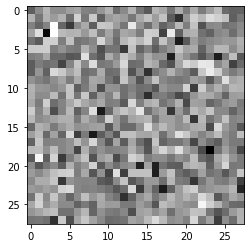

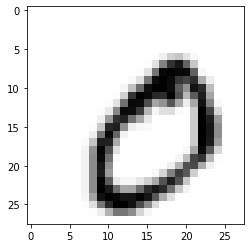

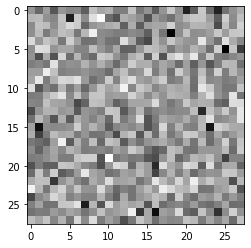

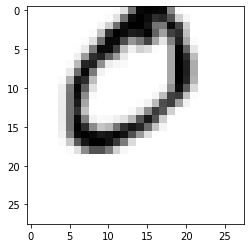

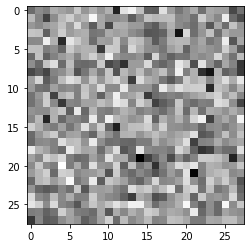

...

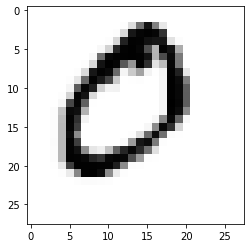

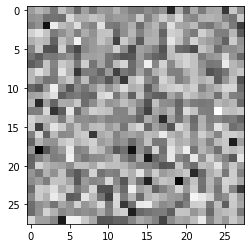

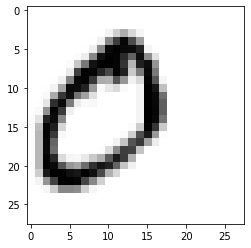

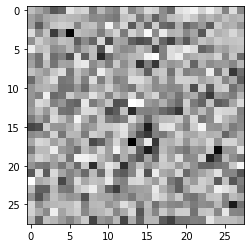

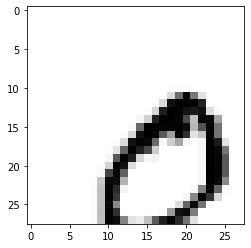

In [42]:
data=next(iter(dataloader))[0]
out,al,s=model(data)
for i in range(20):
    plt.imshow(out[i].reshape(dim,dim).cpu().detach(), cmap="Greys")
    plt.show()
    plt.imshow(data[i].reshape(dim,dim).cpu().detach(), cmap="Greys")
    plt.show()
    print(' ')

In [46]:
K=1

In [47]:
#train 1 digit regular model
class alpha_generator_linear(nn.Module):
    def __init__(self,K,s_size=2):
        super(alpha_generator_linear,self).__init__()
        self.fc1 = nn.Linear(784, 220)
        self.bn1 = nn.BatchNorm1d(220)
        self.fc2 = nn.Linear(220, 220)
        self.bn2 = nn.BatchNorm1d(220)
        self.fc3 = nn.Linear(220, 120)
        self.bn3 = nn.BatchNorm1d(120)
        self.fc4 = nn.Linear(120, 1+s_size)
        
    def forward(self,x):
        x = f.relu(self.bn1(self.fc1(x)))
        x = f.relu(self.bn2(self.fc2(x)))
        x = f.relu(self.bn3(self.fc3(x)))
        x = self.fc4(x)
        alpha_generated = x[:,:K]
        s_generated = x[:,K:]
        return alpha_generated,s_generated

class Model(nn.Module):
    def __init__(self,D,L,K):
        super(Model,self).__init__()
        # this initializes parameters
        pre_w = torch.rand(D, L*2).cuda() # (D,J*2)
        w = pre_w*.001
        w = torch.nn.init.xavier_uniform_(w)
        self.w = nn.Parameter(w, requires_grad=True).cuda()
        psi = torch.rand(D,1).cuda()*.0001 # (D,K)
        psi = torch.nn.init.xavier_uniform_(psi)
        self.psi = nn.Parameter(psi,requires_grad=True).cuda()
        
        self.alpha_gen=alpha_generator_linear(K)
    
    # this computes the model output given alpha and s
    def forward(self,y):
        with torch.no_grad():
            self.psi += f.normalize(self.psi,dim=0)-self.psi # TODO change this
        alpha_generated,s_generated=self.alpha_gen(y)
        #print('alpha',alpha_generated.shape)
        #print('s',s_generated.shape)
        #print(s_generated[:5])
        #print(alpha_generated.shape,s_generated.shape)
        #print(B,K,2)
        x = torch.einsum('dk,bk->bd',self.psi,alpha_generated) # (B,D)
        out = lsc.reconstruct(x,self.w,s_generated,omega)
        return out,alpha_generated,s_generated

    def forward_s(self,alpha,s):
        x = torch.einsum('dk,bk->bd',self.psi,alpha) # (B,D)
        out = lsc.reconstruct(x,self.w,s,omega)
        return out
lr=.01
#reg=.0000001
#reg=.0000003
reg=.0000006

model=Model(D,L,K).cuda()
geotorch.orthogonal(model,"w")
shuffle=False


torch_loss_fn = torch.nn.MSELoss()
model_optimizer=torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(model_optimizer,'min',verbose=True,patience=2,threshold=1e-2,cooldown=3)

epoch=0 #lr .0002
while epoch < 100:    
    # Training
    losses=[]
    torch_test_losses=[]
    T=0
    while T < num_train_batches:
        #while T<1:
        y = dl[T]
        #y=torch.zeros_like(y_prev)
        #for i in range(len(y_prev)):
        #    y[i]=erase_img(y_prev[i].reshape(28,28),9,9).reshape(784)
        
        out,alpha_generated,s_generated = model(y)
        l1_reg = reg * torch.norm(alpha_generated, 1)
        pred_loss = torch_loss_fn(out,y)
        #print(pred_loss.item())
        total_loss = pred_loss+l1_reg
        model_optimizer.zero_grad()
        total_loss.backward()
        model_optimizer.step()

        losses.append(pred_loss.item())
        T+=1
        if np.isnan(pred_loss.item()):
            print('nan')
            break
        #print(total_loss.item())
    scheduler.step(np.mean(losses))
    if (epoch)%1==0:
        print(s_generated[:4])
        print(alpha_generated[:10])
        print(epoch,'mean loss',np.mean(losses))
        model.eval()
        validate_linear()
        model.train()
        print('\n')
    epoch+=1


tensor([[-0.1295, -1.4750],
        [ 2.7971,  0.5822],
        [ 1.3945,  0.1781],
        [ 1.9380,  0.5814]], device='cuda:0', grad_fn=<SliceBackward>)
tensor([[ 0.7617],
        [-0.7181],
        [-0.9410],
        [-0.8968],
        [-0.8296],
        [-0.8960],
        [-0.9381],
        [-0.9510],
        [-0.7999],
        [-0.9025]], device='cuda:0', grad_fn=<SliceBackward>)
0 mean loss 0.0005223599240950231
testing reg 6e-07 lr 0.01
val loss 0.0004012363011133857
val l1 0.8069182246923446


tensor([[ 0.1030, -1.4268],
        [ 2.9652,  0.4570],
        [ 1.2730,  0.2187],
        [ 1.9555,  0.6131]], device='cuda:0', grad_fn=<SliceBackward>)
tensor([[ 0.5414],
        [-0.8721],
        [-0.9187],
        [-0.9557],
        [-0.9237],
        [-0.9163],
        [-0.9581],
        [-0.9844],
        [-0.9054],
        [-0.9577]], device='cuda:0', grad_fn=<SliceBackward>)
1 mean loss 0.00027853395316924435
testing reg 6e-07 lr 0.01
val loss 0.0001742447902506683
val l1 0.8972

KeyboardInterrupt: ignored

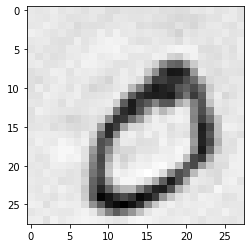

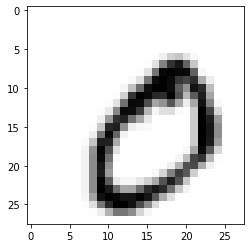

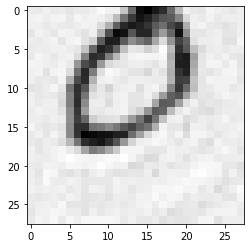

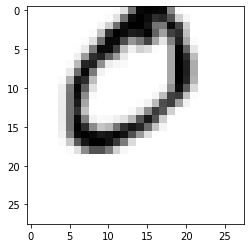

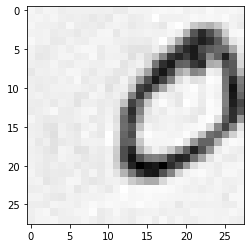

...

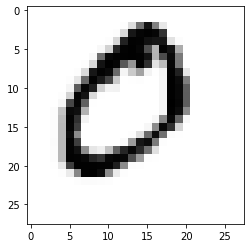

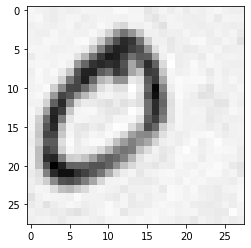

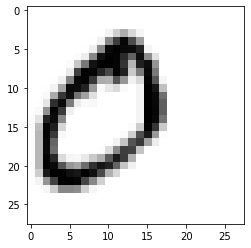

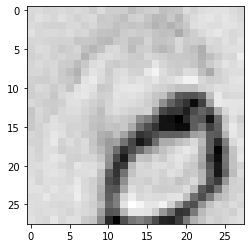

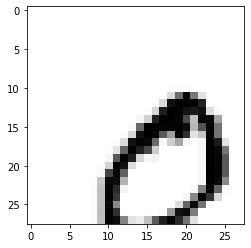

In [48]:
data=next(iter(dataloader))[0]
out,al,s=model(data)
for i in range(20):
    plt.imshow(out[i].reshape(dim,dim).cpu().detach(), cmap="Greys")
    plt.show()
    plt.imshow(data[i].reshape(dim,dim).cpu().detach(), cmap="Greys")
    plt.show()
    print(' ')

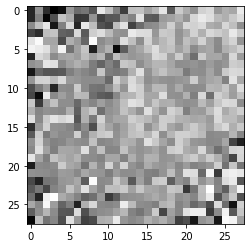

In [51]:
K=10
plt.imshow(model.psi.reshape(dim,dim).cpu().detach(), cmap="Greys")
plt.show()

In [55]:
#train 2 digit regular model
K=2
class alpha_generator_linear(nn.Module):
    def __init__(self,K,s_size=2):
        super(alpha_generator_linear,self).__init__()
        self.fc1 = nn.Linear(784, 220)
        self.bn1 = nn.BatchNorm1d(220)
        self.fc2 = nn.Linear(220, 220)
        self.bn2 = nn.BatchNorm1d(220)
        self.fc3 = nn.Linear(220, 120)
        self.bn3 = nn.BatchNorm1d(120)
        self.fc4 = nn.Linear(120, K+s_size)
        
    def forward(self,x):
        x = f.relu(self.bn1(self.fc1(x)))
        x = f.relu(self.bn2(self.fc2(x)))
        x = f.relu(self.bn3(self.fc3(x)))
        x = self.fc4(x)
        alpha_generated = x[:,:K]
        s_generated = x[:,K:]
        return alpha_generated,s_generated

class Model(nn.Module):
    def __init__(self,D,L,K):
        super(Model,self).__init__()
        # this initializes parameters
        pre_w = torch.rand(D, L*2).cuda() # (D,J*2)
        w = pre_w*.001
        w = torch.nn.init.xavier_uniform_(w)
        self.w = nn.Parameter(w, requires_grad=True).cuda()
        psi = torch.rand(D,K).cuda()*.0001 # (D,K)
        psi = torch.nn.init.xavier_uniform_(psi)
        self.psi = nn.Parameter(psi,requires_grad=True).cuda()
        
        self.alpha_gen=alpha_generator_linear(K)
    
    # this computes the model output given alpha and s
    def forward(self,y):
        with torch.no_grad():
            self.psi += f.normalize(self.psi,dim=0)-self.psi # TODO change this
        alpha_generated,s_generated=self.alpha_gen(y)
        #print('alpha',alpha_generated.shape)
        #print('s',s_generated.shape)
        #print(s_generated[:5])
        #print(alpha_generated.shape,s_generated.shape)
        #print(B,K,2)
        x = torch.einsum('dk,bk->bd',self.psi,alpha_generated) # (B,D)
        out = lsc.reconstruct(x,self.w,s_generated,omega)
        return out,alpha_generated,s_generated

    def forward_s(self,alpha,s):
        x = torch.einsum('dk,bk->bd',self.psi,alpha) # (B,D)
        out = lsc.reconstruct(x,self.w,s,omega)
        return out
lr=.01
#reg=.0000001
#reg=.0000003
reg=.0000006

model=Model(D,L,K).cuda()
geotorch.orthogonal(model,"w")
shuffle=False


torch_loss_fn = torch.nn.MSELoss()
model_optimizer=torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(model_optimizer,'min',verbose=True,patience=2,threshold=1e-2,cooldown=3)

epoch=0 #lr .0002
while epoch < 100:    
    # Training
    losses=[]
    torch_test_losses=[]
    T=0
    while T < num_train_batches:
        #while T<1:
        y = dl[T]
        #y=torch.zeros_like(y_prev)
        #for i in range(len(y_prev)):
        #    y[i]=erase_img(y_prev[i].reshape(28,28),9,9).reshape(784)
        
        out,alpha_generated,s_generated = model(y)
        l1_reg = reg * torch.norm(alpha_generated, 1)
        pred_loss = torch_loss_fn(out,y)
        #print(pred_loss.item())
        total_loss = pred_loss+l1_reg
        model_optimizer.zero_grad()
        total_loss.backward()
        model_optimizer.step()

        losses.append(pred_loss.item())
        T+=1
        if np.isnan(pred_loss.item()):
            print('nan')
            break
        #print(total_loss.item())
    scheduler.step(np.mean(losses))
    if (epoch)%1==0:
        print(s_generated[:4])
        print(alpha_generated[:10])
        print(epoch,'mean loss',np.mean(losses))
        model.eval()
        validate_linear()
        model.train()
        print('\n')
    epoch+=1


tensor([[ 1.1615, -1.1999],
        [ 0.8762, -1.7517],
        [-0.7715, -1.5503],
        [-1.0320, -1.7807]], device='cuda:0', grad_fn=<SliceBackward>)
tensor([[-0.7988,  0.0979],
        [-0.0075,  0.8575],
        [-0.8925, -0.1591],
        [ 0.0198,  0.8459],
        [-0.0045,  0.8307],
        [-0.8199,  0.1138],
        [ 0.1835,  0.8613],
        [ 0.0559,  0.8745],
        [-0.0042,  0.8578],
        [-0.0958,  0.8295]], device='cuda:0', grad_fn=<SliceBackward>)
0 mean loss 0.00042837442861734114
testing reg 6e-07 lr 0.01
val loss 0.00024187122413422914
val l1 0.9178981208801269


tensor([[ 1.1174, -1.6178],
        [ 0.7774, -1.9619],
        [-0.6319, -0.7452],
        [-1.0726, -1.9779]], device='cuda:0', grad_fn=<SliceBackward>)
tensor([[-8.3095e-01,  8.0718e-02],
        [-5.9430e-04,  8.7388e-01],
        [-4.3720e-01,  5.0871e-01],
        [ 5.2067e-02,  8.9125e-01],
        [-5.7434e-03,  8.6875e-01],
        [-8.7620e-01,  5.5013e-02],
        [ 2.8863e-02,  8.5771e

KeyboardInterrupt: ignored

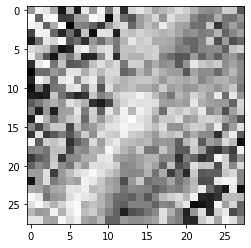

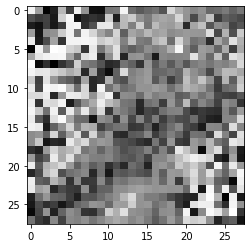

In [58]:
for i in range(2):
    plt.imshow(model.psi[:,i].reshape(dim,dim).cpu().detach(), cmap="Greys")
    plt.show()

In [63]:
#train 2 digit regular model
K=3
class alpha_generator_linear(nn.Module):
    def __init__(self,K,s_size=2):
        super(alpha_generator_linear,self).__init__()
        self.fc1 = nn.Linear(784, 220)
        self.bn1 = nn.BatchNorm1d(220)
        self.fc2 = nn.Linear(220, 220)
        self.bn2 = nn.BatchNorm1d(220)
        self.fc3 = nn.Linear(220, 120)
        self.bn3 = nn.BatchNorm1d(120)
        self.fc4 = nn.Linear(120, K+s_size)
        
    def forward(self,x):
        x = f.relu(self.bn1(self.fc1(x)))
        x = f.relu(self.bn2(self.fc2(x)))
        x = f.relu(self.bn3(self.fc3(x)))
        x = self.fc4(x)
        alpha_generated = x[:,:K]
        s_generated = x[:,K:]
        return alpha_generated,s_generated

class Model(nn.Module):
    def __init__(self,D,L,K):
        super(Model,self).__init__()
        # this initializes parameters
        pre_w = torch.rand(D, L*2).cuda() # (D,J*2)
        w = pre_w*.001
        w = torch.nn.init.xavier_uniform_(w)
        self.w = nn.Parameter(w, requires_grad=True).cuda()
        psi = torch.rand(D,K).cuda()*.0001 # (D,K)
        psi = torch.nn.init.xavier_uniform_(psi)
        self.psi = nn.Parameter(psi,requires_grad=True).cuda()
        
        self.alpha_gen=alpha_generator_linear(K)
    
    # this computes the model output given alpha and s
    def forward(self,y):
        with torch.no_grad():
            self.psi += f.normalize(self.psi,dim=0)-self.psi # TODO change this
        alpha_generated,s_generated=self.alpha_gen(y)
        #print('alpha',alpha_generated.shape)
        #print('s',s_generated.shape)
        #print(s_generated[:5])
        #print(alpha_generated.shape,s_generated.shape)
        #print(B,K,2)
        x = torch.einsum('dk,bk->bd',self.psi,alpha_generated) # (B,D)
        out = lsc.reconstruct(x,self.w,s_generated,omega)
        return out,alpha_generated,s_generated

    def forward_s(self,alpha,s):
        x = torch.einsum('dk,bk->bd',self.psi,alpha) # (B,D)
        out = lsc.reconstruct(x,self.w,s,omega)
        return out
lr=.01
#reg=.0000001
#reg=.0000003
reg=.0000006

model=Model(D,L,K).cuda()
geotorch.orthogonal(model,"w")
shuffle=False


torch_loss_fn = torch.nn.MSELoss()
model_optimizer=torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(model_optimizer,'min',verbose=True,patience=2,threshold=1e-2,cooldown=3)

epoch=0 #lr .0002
while epoch < 100:    
    # Training
    losses=[]
    torch_test_losses=[]
    T=0
    while T < num_train_batches:
        #while T<1:
        y = dl[T]
        #y=torch.zeros_like(y_prev)
        #for i in range(len(y_prev)):
        #    y[i]=erase_img(y_prev[i].reshape(28,28),9,9).reshape(784)
        
        out,alpha_generated,s_generated = model(y)
        l1_reg = reg * torch.norm(alpha_generated, 1)
        pred_loss = torch_loss_fn(out,y)
        #print(pred_loss.item())
        total_loss = pred_loss+l1_reg
        model_optimizer.zero_grad()
        total_loss.backward()
        model_optimizer.step()

        losses.append(pred_loss.item())
        T+=1
        if np.isnan(pred_loss.item()):
            print('nan')
            break
        #print(total_loss.item())
    scheduler.step(np.mean(losses))
    if (epoch)%1==0:
        #print(s_generated[:4])
        #print(alpha_generated[:10])
        print(epoch,'mean loss',np.mean(losses))
        model.eval()
        validate_linear()
        model.train()
        print('\n')
    epoch+=1


0 mean loss 0.00047385163246265924
testing reg 6e-07 lr 0.01
val loss 0.00030219353997381406
val l1 1.0604208636283874


1 mean loss 0.00030902533365103106
testing reg 6e-07 lr 0.01
val loss 0.00026754982303828
val l1 1.0705557203292846


2 mean loss 0.0002690406400991681
testing reg 6e-07 lr 0.01
val loss 0.0002430415476555936
val l1 1.0681255733966828


3 mean loss 0.00024450765869308573
testing reg 6e-07 lr 0.01
val loss 0.0002355110591452103
val l1 1.0651556646823883


4 mean loss 0.0002194984910359684
testing reg 6e-07 lr 0.01
val loss 0.00019617940895841457
val l1 1.04272567152977


5 mean loss 0.00017618002573726698
testing reg 6e-07 lr 0.01
val loss 0.000142206879099831
val l1 1.0094977766275406


6 mean loss 0.00013623337684596967
testing reg 6e-07 lr 0.01
val loss 0.00010551885177846998
val l1 0.9931405645608902


7 mean loss 0.00011064006974872124
testing reg 6e-07 lr 0.01
val loss 8.328706579050049e-05
val l1 0.9909517580270767


8 mean loss 9.625125048235835e-05
testing re

KeyboardInterrupt: ignored

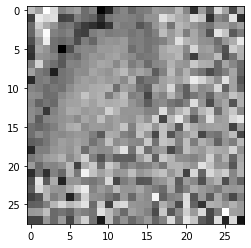

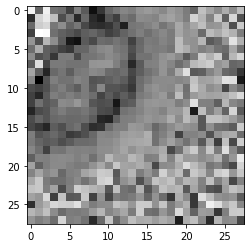

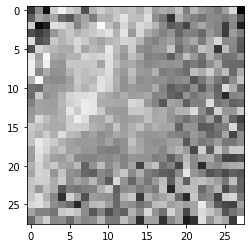

In [64]:
for i in range(3):
    plt.imshow(model.psi[:,i].reshape(dim,dim).cpu().detach(), cmap="Greys")
    plt.show()

In [68]:
#train 2 digit regular model
K=4
class alpha_generator_linear(nn.Module):
    def __init__(self,K,s_size=2):
        super(alpha_generator_linear,self).__init__()
        self.fc1 = nn.Linear(784, 220)
        self.bn1 = nn.BatchNorm1d(220)
        self.fc2 = nn.Linear(220, 220)
        self.bn2 = nn.BatchNorm1d(220)
        self.fc3 = nn.Linear(220, 120)
        self.bn3 = nn.BatchNorm1d(120)
        self.fc4 = nn.Linear(120, K+s_size)
        
    def forward(self,x):
        x = f.relu(self.bn1(self.fc1(x)))
        x = f.relu(self.bn2(self.fc2(x)))
        x = f.relu(self.bn3(self.fc3(x)))
        x = self.fc4(x)
        alpha_generated = x[:,:K]
        s_generated = x[:,K:]
        return alpha_generated,s_generated

class Model(nn.Module):
    def __init__(self,D,L,K):
        super(Model,self).__init__()
        # this initializes parameters
        pre_w = torch.rand(D, L*2).cuda() # (D,J*2)
        w = pre_w*.001
        w = torch.nn.init.xavier_uniform_(w)
        self.w = nn.Parameter(w, requires_grad=True).cuda()
        psi = torch.rand(D,K).cuda()*.0001 # (D,K)
        psi = torch.nn.init.xavier_uniform_(psi)
        self.psi = nn.Parameter(psi,requires_grad=True).cuda()
        
        self.alpha_gen=alpha_generator_linear(K)
    
    # this computes the model output given alpha and s
    def forward(self,y):
        with torch.no_grad():
            self.psi += f.normalize(self.psi,dim=0)-self.psi # TODO change this
        alpha_generated,s_generated=self.alpha_gen(y)
        #print('alpha',alpha_generated.shape)
        #print('s',s_generated.shape)
        #print(s_generated[:5])
        #print(alpha_generated.shape,s_generated.shape)
        #print(B,K,2)
        x = torch.einsum('dk,bk->bd',self.psi,alpha_generated) # (B,D)
        out = lsc.reconstruct(x,self.w,s_generated,omega)
        return out,alpha_generated,s_generated

    def forward_s(self,alpha,s):
        x = torch.einsum('dk,bk->bd',self.psi,alpha) # (B,D)
        out = lsc.reconstruct(x,self.w,s,omega)
        return out
lr=.01
#reg=.0000001
#reg=.0000003
reg=.0000006

model=Model(D,L,K).cuda()
geotorch.orthogonal(model,"w")
shuffle=False


torch_loss_fn = torch.nn.MSELoss()
model_optimizer=torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(model_optimizer,'min',verbose=True,patience=2,threshold=1e-2,cooldown=3)

epoch=0 #lr .0002
while epoch < 100:    
    # Training
    losses=[]
    torch_test_losses=[]
    T=0
    while T < num_train_batches:
        #while T<1:
        y = dl[T]
        #y=torch.zeros_like(y_prev)
        #for i in range(len(y_prev)):
        #    y[i]=erase_img(y_prev[i].reshape(28,28),9,9).reshape(784)
        
        out,alpha_generated,s_generated = model(y)
        l1_reg = reg * torch.norm(alpha_generated, 1)
        pred_loss = torch_loss_fn(out,y)
        #print(pred_loss.item())
        total_loss = pred_loss+l1_reg
        model_optimizer.zero_grad()
        total_loss.backward()
        model_optimizer.step()

        losses.append(pred_loss.item())
        T+=1
        if np.isnan(pred_loss.item()):
            print('nan')
            break
        #print(total_loss.item())
    scheduler.step(np.mean(losses))
    if (epoch)%1==0:
        #print(s_generated[:4])
        #print(alpha_generated[:10])
        print(epoch,'mean loss',np.mean(losses))
        model.eval()
        validate_linear()
        model.train()
        print('\n')
    epoch+=1


0 mean loss 0.0004781099407894847
testing reg 6e-07 lr 0.01
val loss 0.0003654223628109321
val l1 1.1033731174468995


1 mean loss 0.0003074356871123503
testing reg 6e-07 lr 0.01
val loss 0.00028724707051878794
val l1 1.1106703007221221


2 mean loss 0.0002533329586973802
testing reg 6e-07 lr 0.01
val loss 0.00017291973330429755
val l1 0.9901670920848846


3 mean loss 0.0001441368258262325
testing reg 6e-07 lr 0.01
val loss 9.902555750159081e-05
val l1 0.9855010986328125


4 mean loss 0.00010019658899788435
testing reg 6e-07 lr 0.01
val loss 8.092470015981234e-05
val l1 0.9864190083742141


5 mean loss 8.541538911231327e-05
testing reg 6e-07 lr 0.01
val loss 6.812588617322035e-05
val l1 0.9924303263425827




KeyboardInterrupt: ignored

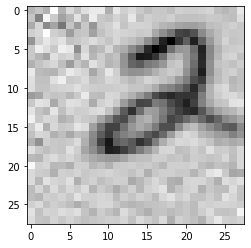

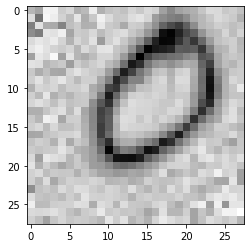

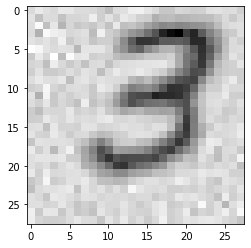

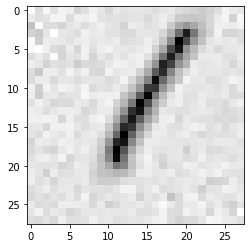

In [69]:
for i in range(4):
    plt.imshow(model.psi[:,i].reshape(dim,dim).cpu().detach(), cmap="Greys")
    plt.show()